In [1]:
from ebmdatalab import bq
from change_detection import functions as chg
import os
from lib.outliers import *
import json
import requests
from pandas.io.json import json_normalize
from bs4 import BeautifulSoup as bs
%load_ext autoreload
%autoreload 2
import time

/home/app/notebook/lib/outliers.py:11: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


## Get names of "core" openprescribing measures from GitHub

In [14]:
#by scraping the details off of the measures definition GitHub page, we can populate graphs with titles, rather than measure name
res = requests.get('https://github.com/ebmdatalab/openprescribing/tree/main/openprescribing/measure_definitions') #open scraper for measure definitions
soup = bs(res.text, 'html.parser')   
file = soup.find_all('a',class_="js-navigation-open")
json_df = pd.DataFrame() #create dataframe 
for i in file:
    if '.json' in i.text: #find links in measure definition page for JSON measures
        url = 'https://raw.githubusercontent.com/ebmdatalab/openprescribing/main/openprescribing/measure_definitions/' + i.text #create URL for each measure definition
        data = json.loads(requests.get(url).text) #load JSON from measure definition
        norm_df = pd.json_normalize(data, max_level=1) #normalise data to fit in dataframe format and put into dataframe
        measure_name = i.text.replace(".json", "") # creates measure name from url (minus JSON)
        norm_df['measure_name'] = measure_name # adds measure name to dataframe
        json_df = pd.concat([json_df,norm_df], axis=0, ignore_index=True) #adds row to final dataframe
name_df = json_df[['measure_name','name']] #creates new df with just measure_name and descriptive name

## Run Change Detection module on all data at SICBL (formerly CCG) level

In [3]:
lp = chg.ChangeDetection('ccg_data_%', measure=True) #ccg_data_ will run all current measures in the database
lp.run()

Downloading: 100%|██████████| 6466/6466 [00:00<00:00, 12257.40rows/s]


## Create one single dataframe for all change detection calculations

In [9]:
lp_spark  = lp.concatenate_outputs()
lp_spark.head()

is.nbreak  is.tfirst  is.tfirst.pknown  \
measure             name                                           
ccg_data_aafpercent 00L   3          14.0       14.0               
                    00N   0         NaN        NaN                 
                    00P   2          25.0       25.0               
                    00Q   0         NaN        NaN                 
                    00R   0         NaN        NaN                 

                          is.tfirst.pknown.offs  is.tfirst.offs  \
measure             name                                          
ccg_data_aafpercent 00L   18.0                   18.0             
                    00N  NaN                    NaN               
                    00P   26.0                   26.0             
                    00Q  NaN                    NaN               
                    00R  NaN                    NaN               

                          is.tfirst.big  is.slope.ma  is.slope.ma.prop  \
measure             name                                                 
ccg_data_aafpercent 00L   18.0          -0.008323    -0.017381           
                    00N  NaN            NaN          NaN                 
                    00P   26.0           0.003967     0.013469           
                    00Q  NaN            NaN          NaN                 
                    00R  NaN            NaN          NaN                 

                          is.slope.ma.prop.lev  is.intlev.initlev  \
measure             name                                            
ccg_data_aafpercent 00L   0.513817              0.468522            
                    00N  NaN                   NaN                  
                    00P   0.505941              0.366746            
                    00Q  NaN                   NaN                  
                    00R  NaN                   NaN                  

                          is.intlev.finallev  is.intlev.levd  \
measure             name                                       
ccg_data_aafpercent 00L   0.355130            0.113392         
                    00N  NaN                 NaN               
                    00P   0.437308           -0.070562         
                    00Q  NaN                 NaN               
                    00R  NaN                 NaN               

                          is.intlev.levdprop  
measure             name                      
ccg_data_aafpercent 00L   0.242021            
                    00N  NaN                  
                    00P  -0.192401            
                    00Q  NaN                  
                    00R  NaN

## Create sparkline and details of change for each measure

,table_id,measure_name,name
0,ccg_data_aafpercent,aafpercent,Prescribing of Amino Acid Formula (AAF) and Extensively Hydrolysed Formula (EHF))
1,ccg_data_ace,ace,High-cost Angiotensin-Converting Enzyme (ACE) inhibitors
2,ccg_data_bdzadq,bdzadq,Anxiolytics and Hypnotics: Average Daily Quantity per item
3,ccg_data_bdzper1000,bdzper1000,Anxiolytics and Hypnotics: Average Daily Quantity per 1000 patients
4,ccg_data_carbon_salbutamol,carbon_salbutamol,Environmental impact of inhalers - average carbon footprint per salbutamol inhaler


Prescribing of Amino Acid Formula (AAF) and Extensively Hydrolysed Formula (EHF))


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3081.25rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS NORTH CUMBRIA,2020-08-01,0.276416,
NHS HULL,2019-05-01,0.148510,
NHS WEST LANCASHIRE,2019-02-01,0.101118,

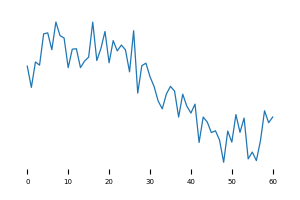
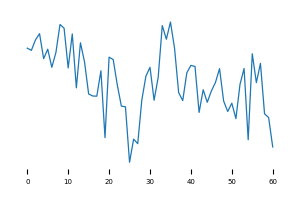
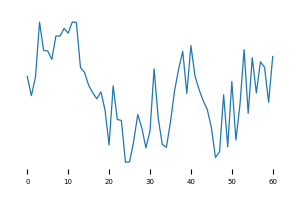

High-cost Angiotensin-Converting Enzyme (ACE) inhibitors


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3111.73rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS KENT AND MEDWAY,2018-07-01,0.550155,
NHS BASSETLAW,2021-07-01,0.368262,
NHS LINCOLNSHIRE,2021-05-01,0.337369,

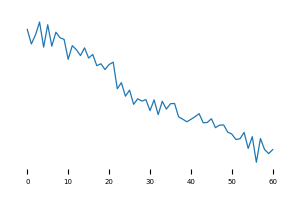
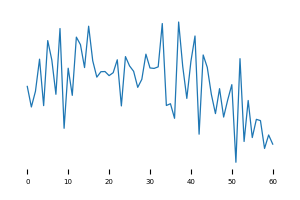
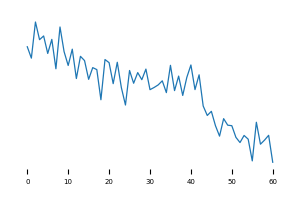

Anxiolytics and Hypnotics: Average Daily Quantity per item


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3443.25rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOUTHEND,2019-09-01,0.129205,
"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES",2019-04-01,0.119106,
NHS STAFFORD AND SURROUNDS,2020-08-01,0.114876,
NHS SURREY HEARTLANDS,2020-07-01,0.111090,
NHS NORTH STAFFORDSHIRE,2020-08-01,0.110062,
NHS OLDHAM,2021-02-01,0.102873,
NHS ROTHERHAM,2020-01-01,0.089976,
NHS BERKSHIRE WEST,2020-05-01,0.086292,
"NHS HAMPSHIRE, SOUTHAMPTON AND ISLE OF WIGHT",2020-11-01,0.084887,

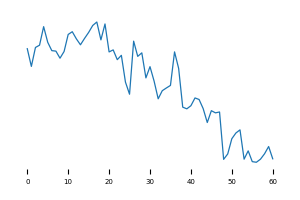
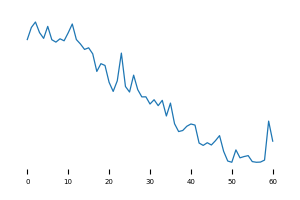
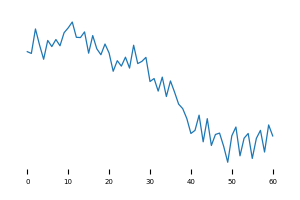
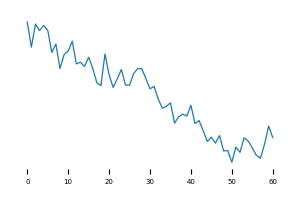
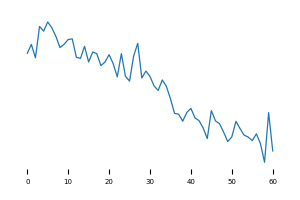
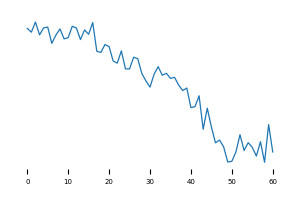
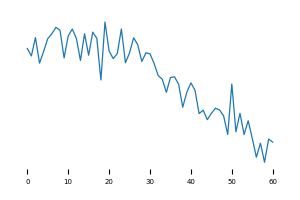
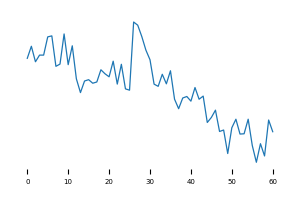
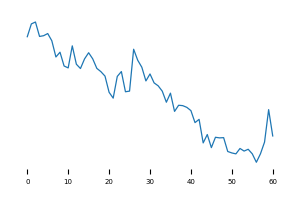
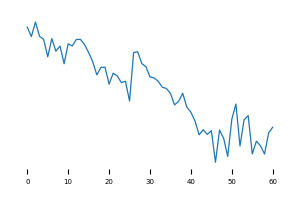

Anxiolytics and Hypnotics: Average Daily Quantity per 1000 patients


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3408.84rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS STAFFORD AND SURROUNDS,2019-06-01,0.416610,
NHS DEVON,2018-02-01,0.293417,
NHS TAMESIDE AND GLOSSOP,2018-09-01,0.293371,
NHS BARNSLEY,2018-04-01,0.269767,
NHS SOUTHEND,2019-01-01,0.265104,
NHS WIRRAL,2018-11-01,0.233805,
NHS SOUTHPORT AND FORMBY,2018-09-01,0.226777,
NHS NORTH EAST ESSEX,2018-02-01,0.199747,
NHS SOUTH SEFTON,2019-08-01,0.123435,

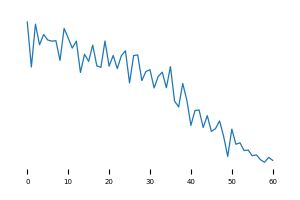
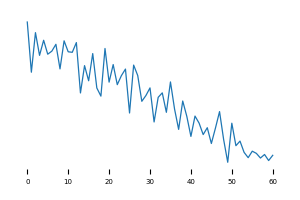
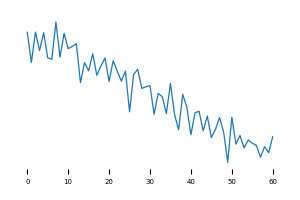
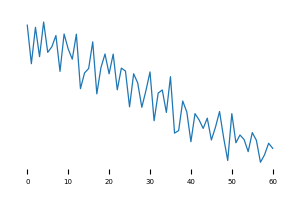
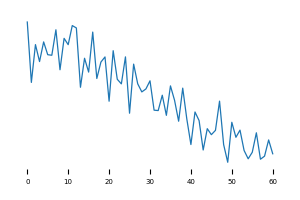
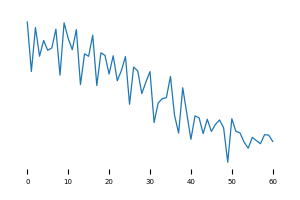
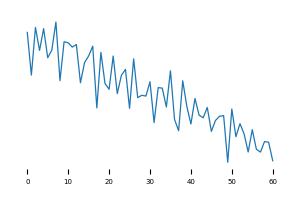
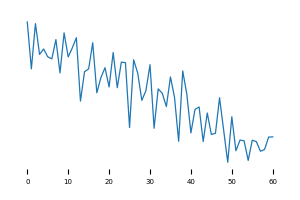
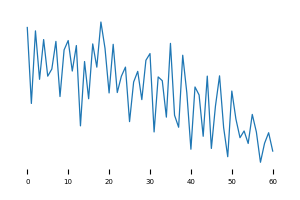

Environmental impact of inhalers - average carbon footprint per salbutamol inhaler


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3365.88rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS CHESHIRE,2021-07-01,0.401182,
NHS HERTS VALLEYS,2021-11-01,0.371100,
"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCESTERSHIRE",2021-11-01,0.360793,
NHS NORTH STAFFORDSHIRE,2022-07-01,0.339273,
NHS FRIMLEY,2021-08-01,0.278861,
NHS BASILDON AND BRENTWOOD,2022-07-01,0.275539,
NHS BRIGHTON AND HOVE,2021-11-01,0.237719,
NHS THURROCK,2022-07-01,0.229974,
NHS CANNOCK CHASE,2022-09-01,0.220200,

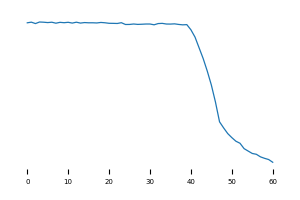
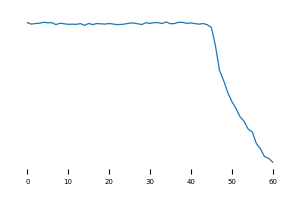
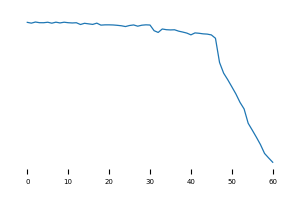
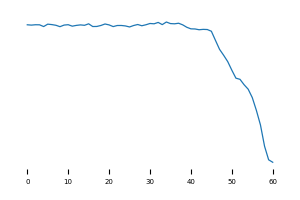
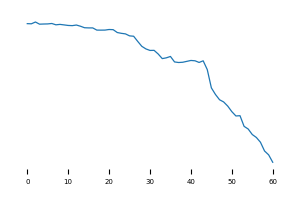
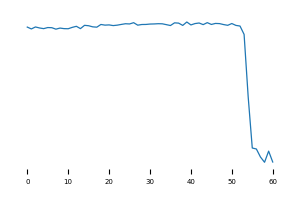
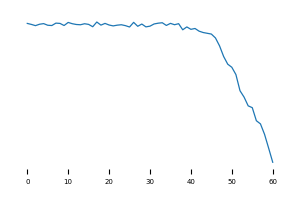
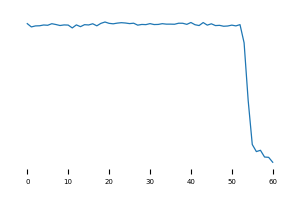
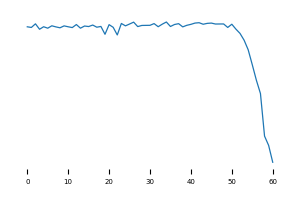
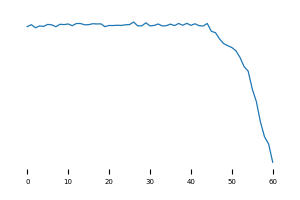

Prescribing of continuous glucose monitoring sensors


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3571.96rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS MORECAMBE BAY,2019-04-01,-0.718856,
"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCESTERSHIRE",2019-03-01,-1.052967,
NHS ST HELENS,2018-08-01,-3.641653,
NHS HALTON,2020-11-01,-9.111807,
NHS KERNOW,2020-12-01,-9.517262,
NHS WIGAN BOROUGH,2018-02-01,-12.886123,
NHS EAST SUSSEX,2019-03-01,-15.631585,
NHS SURREY HEARTLANDS,2019-02-01,-15.911444,
NHS TAMESIDE AND GLOSSOP,2020-08-01,-17.998576,

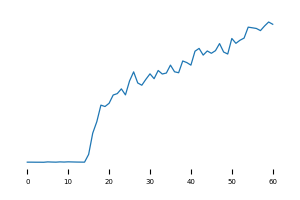
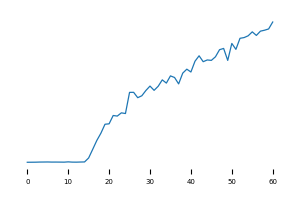
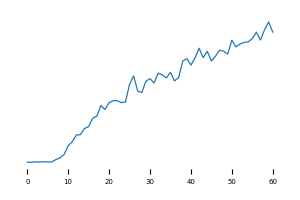
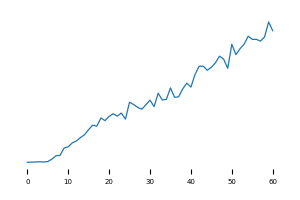
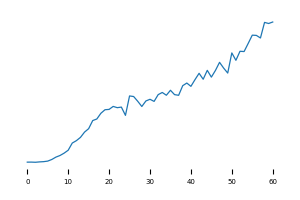
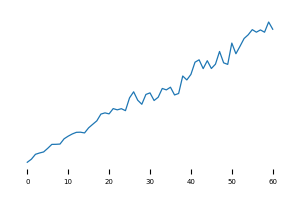
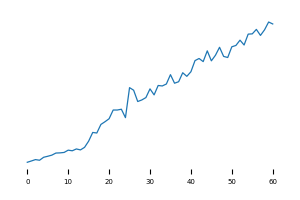
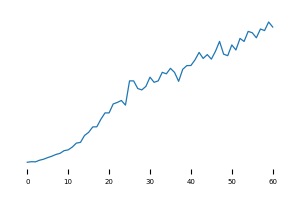
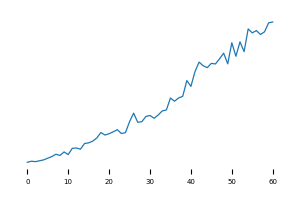
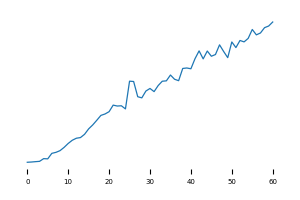

Ciclosporin and tacrolimus oral preparations prescribed generically


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4194.38rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOMERSET,2019-07-01,0.985874,
NHS NORTH CENTRAL LONDON,2019-06-01,0.792954,
NHS MANCHESTER,2020-03-01,0.671820,
NHS KENT AND MEDWAY,2020-09-01,0.598246,
NHS BUCKINGHAMSHIRE,2019-02-01,0.476386,
NHS NORTH EAST LONDON,2020-08-01,0.382794,

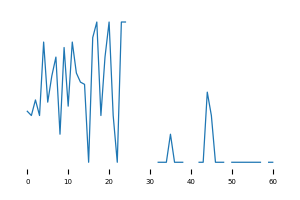
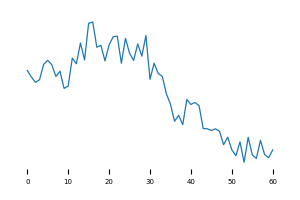
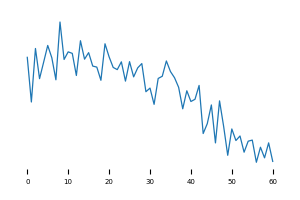
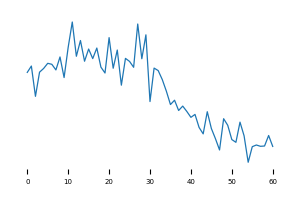
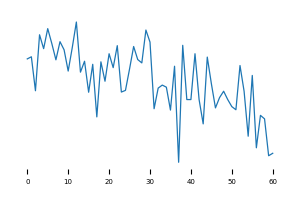
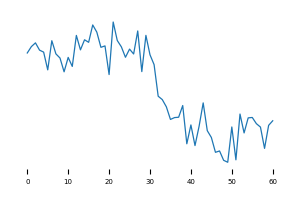

Cost of milk formulae for Cow's Milk Protein Allergy (CMPA) per listed patients aged 0-4


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3461.07rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Co-proxamol


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3965.68rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCESTERSHIRE",2021-09-01,0.667919,

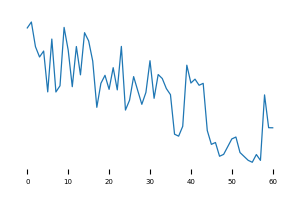

Desogestrel prescribed as a branded product


Downloading: 100%|██████████| 457/457 [00:00<00:00, 1599.84rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS WIRRAL,2018-10-01,0.793553,
NHS BERKSHIRE WEST,2019-07-01,0.781313,
NHS SUNDERLAND,2019-11-01,0.774185,
NHS NORTHUMBERLAND,2018-09-01,0.600133,
NHS TRAFFORD,2018-07-01,0.597506,
NHS ST HELENS,2019-09-01,0.553629,
"NHS HAMPSHIRE, SOUTHAMPTON AND ISLE OF WIGHT",2018-06-01,0.441747,
NHS HALTON,2020-02-01,0.407481,
NHS CHESHIRE,2021-06-01,0.400867,

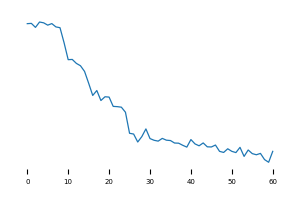
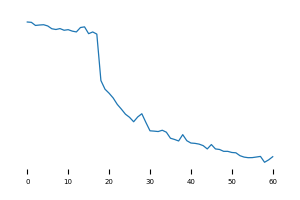
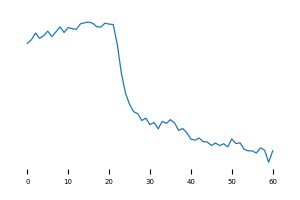
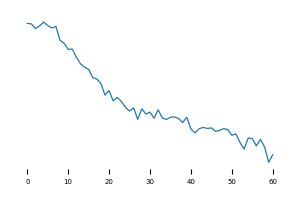
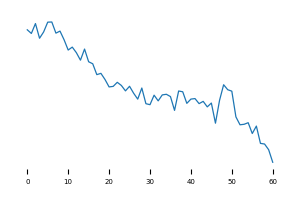
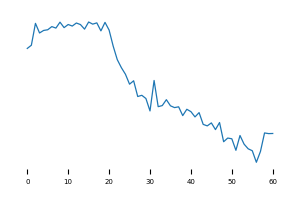
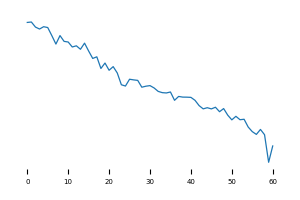
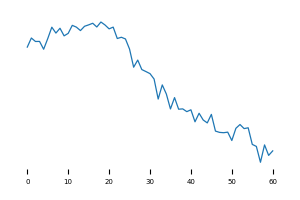
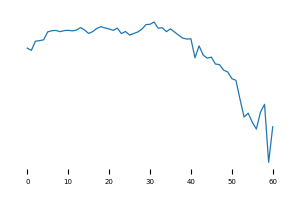
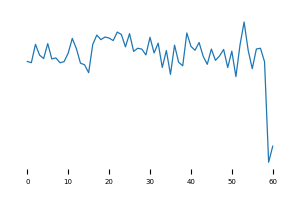

Diltiazem preparations (>60mg) prescribed generically


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3382.52rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS THURROCK,2019-07-01,0.779892,
NHS CHORLEY AND SOUTH RIBBLE,2020-09-01,0.703080,
NHS NORTH EAST LINCOLNSHIRE,2020-08-01,0.623381,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2018-07-01,0.544504,
NHS STAFFORD AND SURROUNDS,2020-05-01,0.537247,
NHS BLACKPOOL,2020-06-01,0.507559,
NHS NORTH WEST LONDON,2018-08-01,0.498922,
NHS SOUTH WEST LONDON,2020-12-01,0.480088,
NHS OXFORDSHIRE,2020-05-01,0.479993,

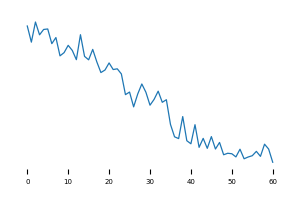
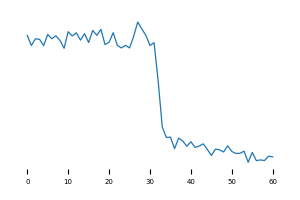
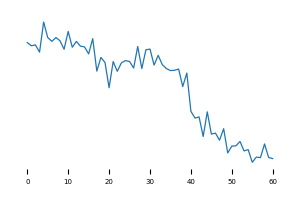
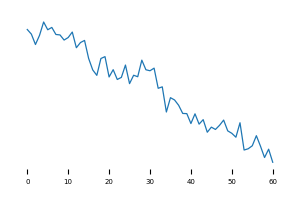
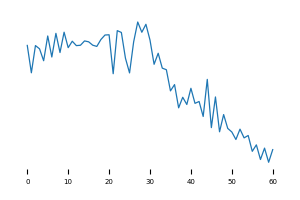
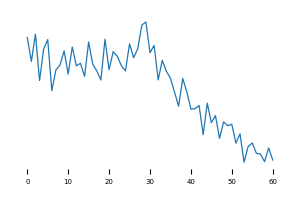
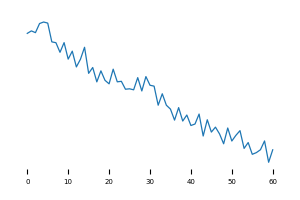
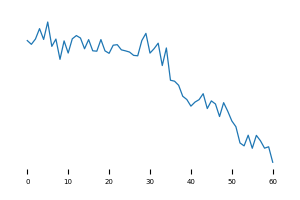
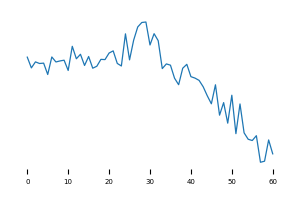
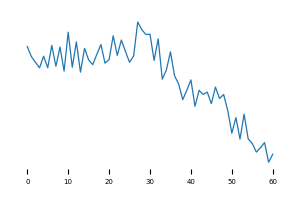

Prescribing of dipyridamole


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3646.04rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Direct Oral Anticoagulants (DOACs)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3207.06rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
"NHS HEYWOOD, MIDDLETON AND ROCHDALE",2018-02-01,-0.053654,
"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCESTERSHIRE",2018-02-01,-0.233299,
NHS NORTH EAST LONDON,2018-02-01,-0.322993,
NHS PORTSMOUTH,2018-02-01,-0.351603,
NHS HERTS VALLEYS,2018-02-01,-0.359880,
NHS TRAFFORD,2018-03-01,-0.360937,
NHS SALFORD,2018-06-01,-0.363093,
NHS NORTH TYNESIDE,2018-02-01,-0.377633,
NHS BIRMINGHAM AND SOLIHULL,2018-03-01,-0.399443,

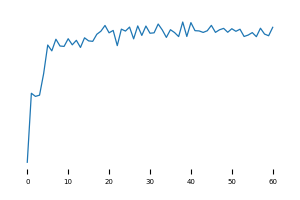
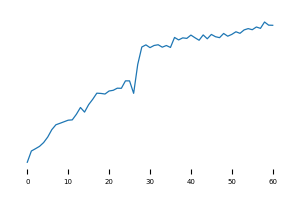
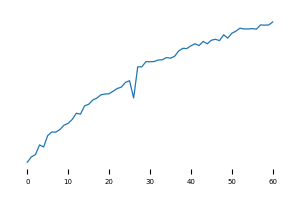
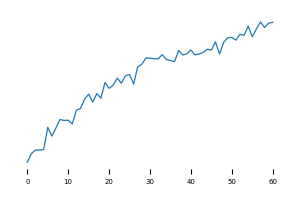
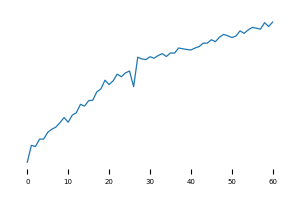
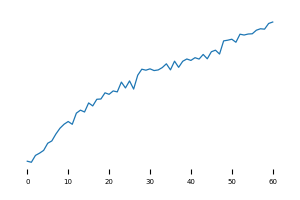
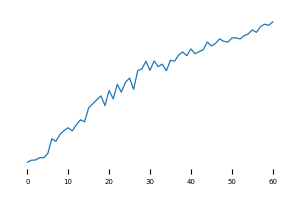
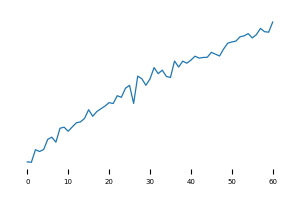
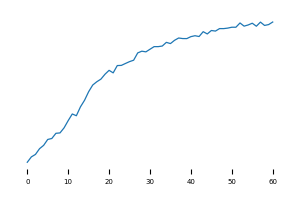
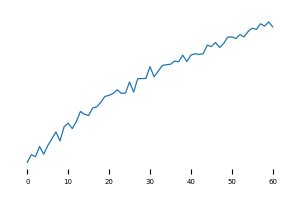

Proportion of Direct Acting Oral Anticoagulants (DOACs) not prescribed as edoxaban


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3643.44rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS GLOUCESTERSHIRE,2022-06-01,0.203801,
NHS EAST RIDING OF YORKSHIRE,2021-11-01,0.176643,
NHS KENT AND MEDWAY,2021-11-01,0.123566,
NHS IPSWICH AND EAST SUFFOLK,2020-05-01,0.115991,
NHS SHEFFIELD,2021-11-01,0.092103,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2021-11-01,0.087764,
NHS NORTHUMBERLAND,2021-12-01,0.077286,
NHS WEST SUSSEX,2021-11-01,0.074827,
NHS HULL,2021-11-01,0.073782,

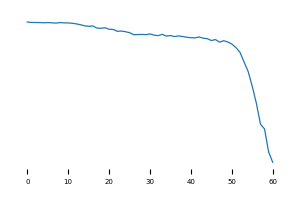
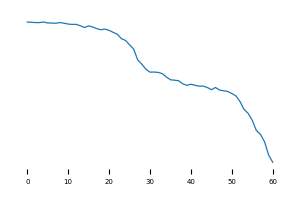
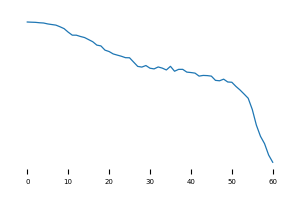
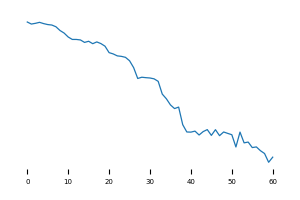
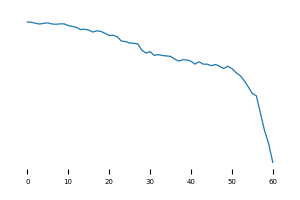
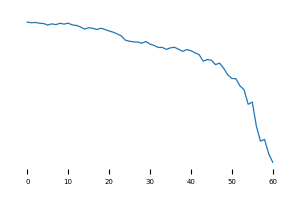
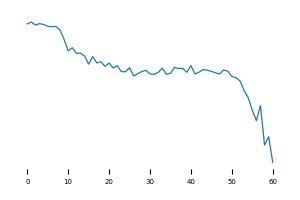
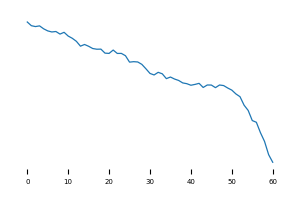
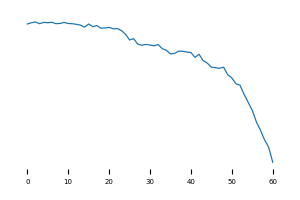
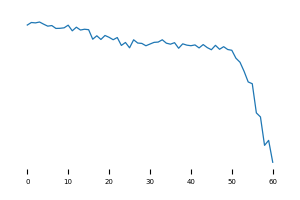

Environmental impact of inhalers - prescribing of non-salbutamol Metered Dose Inhalers (MDIs)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3303.47rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS NORTHAMPTONSHIRE,2020-10-01,0.053374,
NHS BERKSHIRE WEST,2019-09-01,-0.045858,
NHS BIRMINGHAM AND SOLIHULL,2019-05-01,-0.049836,
NHS BUCKINGHAMSHIRE,2020-08-01,-0.057981,
"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES",2019-05-01,-0.088318,
NHS SOUTH EAST STAFFORDSHIRE AND SEISDON PENINSULA,2018-04-01,-0.089963,
NHS IPSWICH AND EAST SUFFOLK,2018-08-01,-0.108078,
NHS BURY,2019-03-01,-0.110818,
NHS EAST STAFFORDSHIRE,2018-07-01,-0.121497,

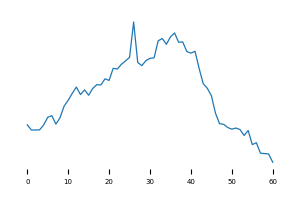
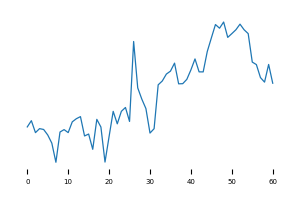
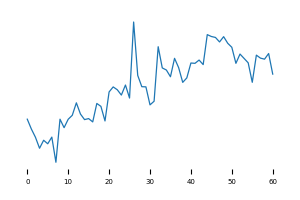
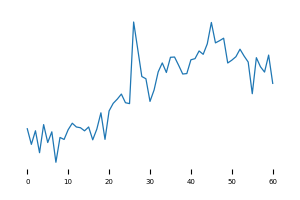
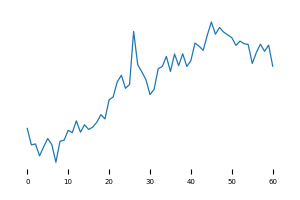
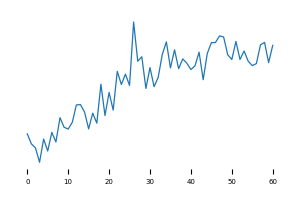
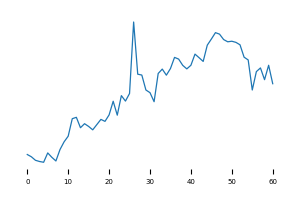
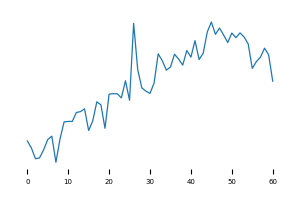
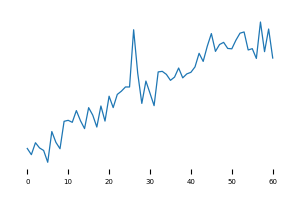
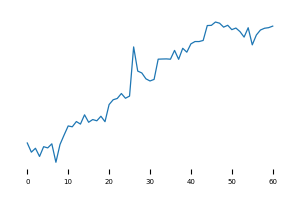

Topical treatment of fungal nail infections


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3648.81rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Prescribing of gabapentin and pregabalin (DDD)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3940.60rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SUNDERLAND,2021-01-01,0.102837,
NHS LIVERPOOL,2018-03-01,-0.177495,
NHS KNOWSLEY,2018-03-01,-0.188189,
NHS ST HELENS,2018-03-01,-0.197006,
NHS BASSETLAW,2018-03-01,-0.199959,
NHS BARNSLEY,2018-03-01,-0.244401,
NHS BLACKPOOL,2018-03-01,-0.270574,
NHS SOUTH SEFTON,2018-03-01,-0.278972,

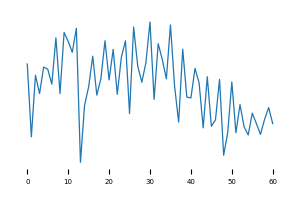
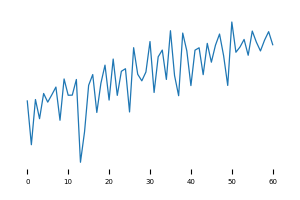
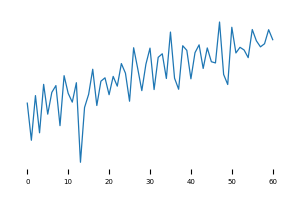
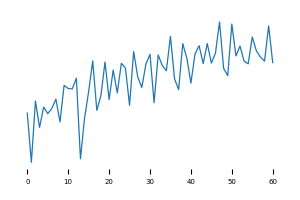
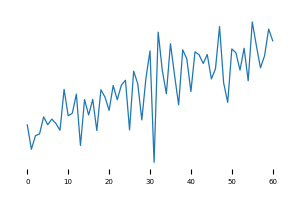
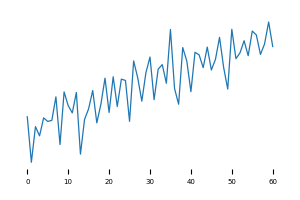
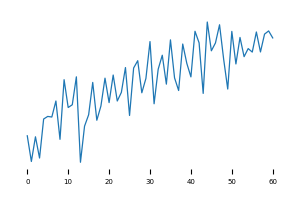
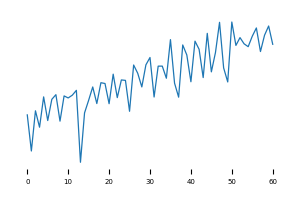

Glaucoma eye drops prescribed by brand


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3569.65rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS THURROCK,2020-01-01,0.214159,
NHS KNOWSLEY,2020-07-01,0.142154,
NHS BASILDON AND BRENTWOOD,2019-07-01,0.131852,
NHS WEST ESSEX,2019-06-01,0.077618,
NHS LIVERPOOL,2019-01-01,-0.024706,
NHS NORTHAMPTONSHIRE,2019-02-01,-0.030885,
"NHS HEYWOOD, MIDDLETON AND ROCHDALE",2018-02-01,-0.143510,
NHS DERBY AND DERBYSHIRE,2018-03-01,-0.159141,
NHS EAST STAFFORDSHIRE,2018-04-01,-0.172885,

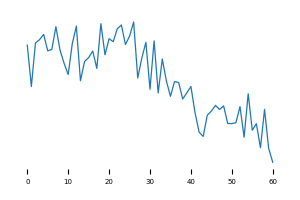
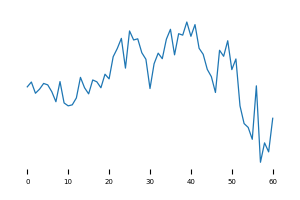
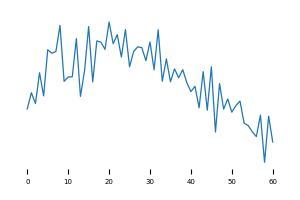
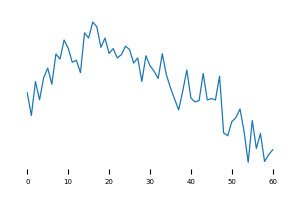
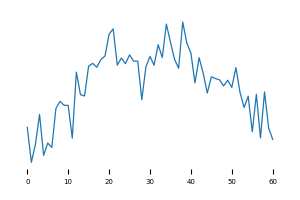
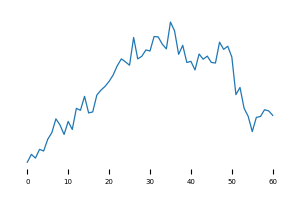
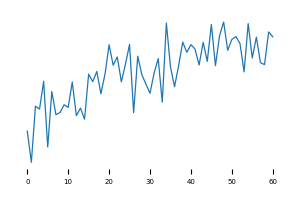
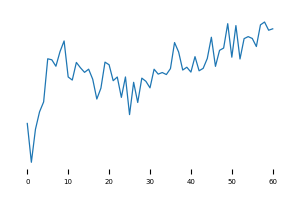
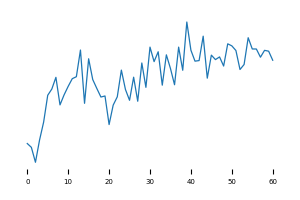
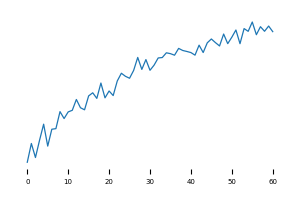

Prescribing of gluten free products


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3600.18rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


High dose inhaled corticosteroids


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3892.61rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS NORTH TYNESIDE,2018-05-01,0.414462,
NHS TEES VALLEY,2018-04-01,0.366193,
NHS COUNTY DURHAM,2018-03-01,0.301896,
NHS EAST AND NORTH HERTFORDSHIRE,2018-03-01,0.273085,
NHS NEWCASTLE GATESHEAD,2018-10-01,0.263702,
NHS GREATER PRESTON,2019-04-01,0.215530,

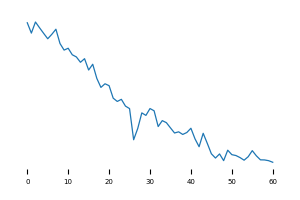
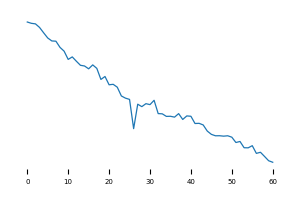
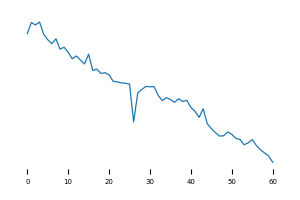
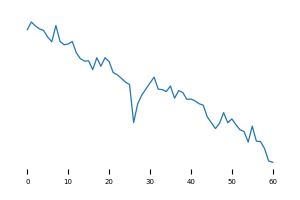
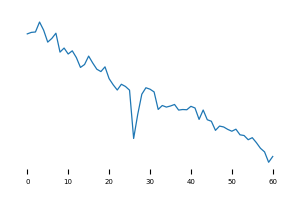
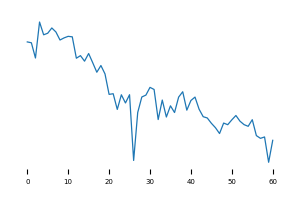

Antibiotic stewardship: Injectable preparations for the treatment of infection


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3796.74rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Levetiracetam prescribed as Keppra


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3602.74rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BOLTON,2018-09-01,0.531694,
NHS EAST SUSSEX,2018-06-01,0.351961,
NHS VALE OF YORK,2020-01-01,0.304486,
NHS BLACK COUNTRY AND WEST BIRMINGHAM,2019-02-01,0.304381,
NHS CALDERDALE,2020-05-01,0.290890,
NHS EAST LANCASHIRE,2019-06-01,0.280277,

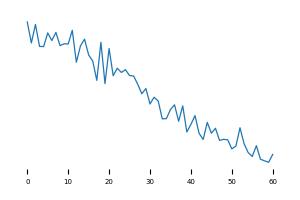
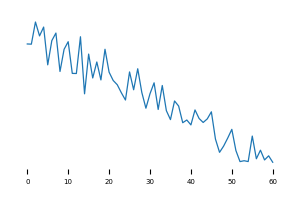
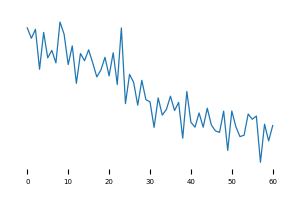
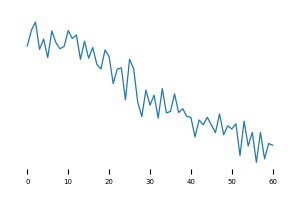
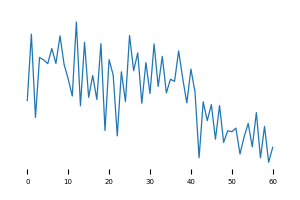
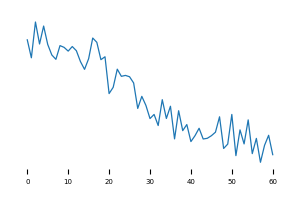

Long-acting insulin analogues (KTT12)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3343.09rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS NORTH EAST LINCOLNSHIRE,2018-03-01,0.057717,
NHS TAMESIDE AND GLOSSOP,2019-05-01,0.044623,
NHS LINCOLNSHIRE,2019-09-01,0.043913,
NHS TRAFFORD,2021-02-01,0.032905,
NHS SOUTH TYNESIDE,2018-07-01,0.027166,
NHS CANNOCK CHASE,2020-09-01,0.000808,
NHS WIGAN BOROUGH,2018-04-01,-0.003383,
NHS COVENTRY AND WARWICKSHIRE,2018-02-01,-0.013895,
NHS BARNSLEY,2018-07-01,-0.014384,

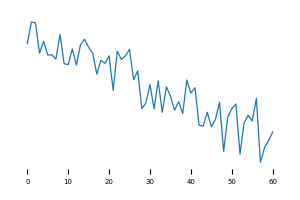
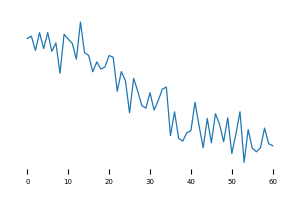
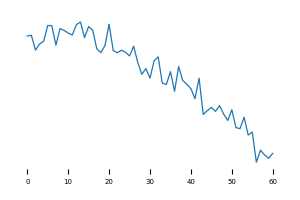
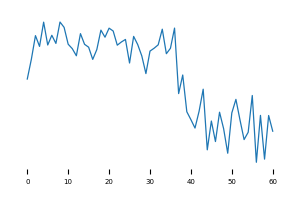
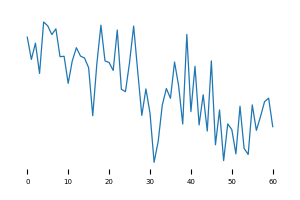
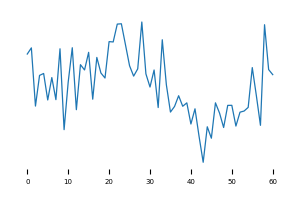
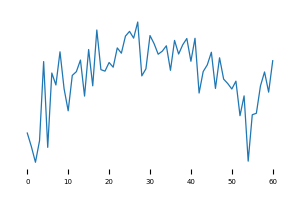
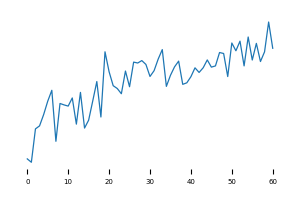
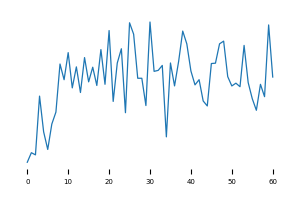
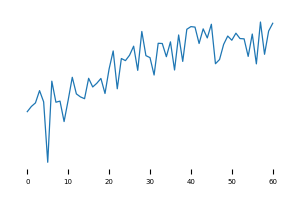

Non-preferred NSAIDs and COX-2 inhibitors (KTT13)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3740.81rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS EAST RIDING OF YORKSHIRE,2018-12-01,-0.120716,
NHS WIRRAL,2018-12-01,-0.143320,
NHS HULL,2018-11-01,-0.152144,

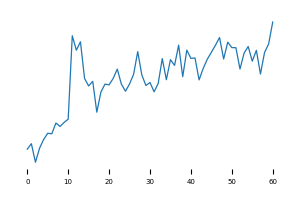
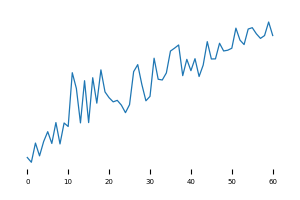
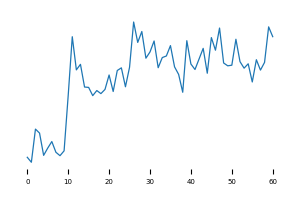

Antibiotic stewardship: volume of antibiotic prescribing (KTT9)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3545.17rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Antibiotic stewardship: co-amoxiclav, cephalosporins & quinolones (KTT9)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3669.81rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BASILDON AND BRENTWOOD,2020-12-01,0.352097,
NHS NORTH EAST ESSEX,2019-10-01,0.316233,
NHS NORTH WEST LONDON,2019-09-01,0.278847,
NHS TRAFFORD,2019-09-01,0.214063,
NHS MID ESSEX,2020-06-01,0.185483,
"NHS BATH AND NORTH EAST SOMERSET, SWINDON AND WILTSHIRE",2019-09-01,0.156485,
NHS WEST SUFFOLK,2019-10-01,0.147939,
NHS WEST SUSSEX,2020-06-01,0.131731,
NHS CAMBRIDGESHIRE AND PETERBOROUGH,2020-05-01,0.125673,

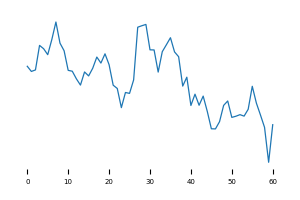
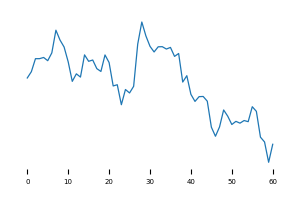
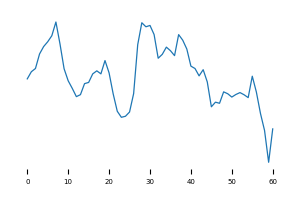
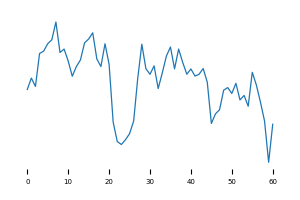
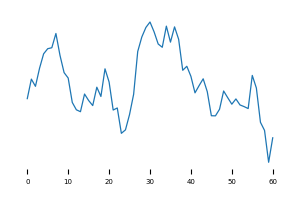
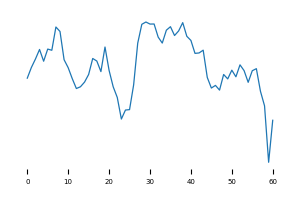
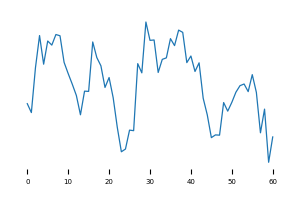
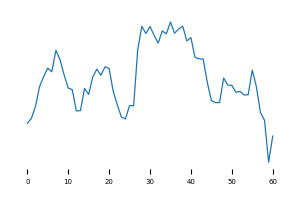
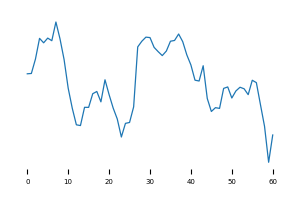
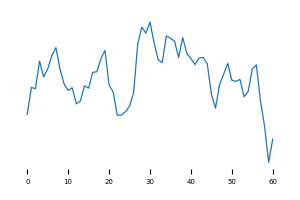

Antibiotic stewardship: co-amoxiclav, cephalosporins & quinolones (KTT9) prescribing volume


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3891.66rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Antibiotic stewardship: three-day courses for uncomplicated UTIs


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3926.25rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BOLTON,2018-12-01,0.315871,
NHS ROTHERHAM,2018-05-01,0.236242,

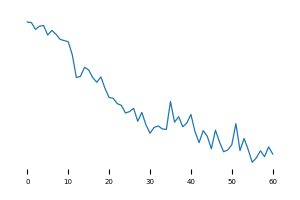
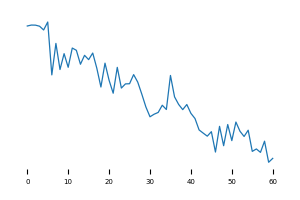

NHS England Low Priority Treatment - Aliskiren


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3067.53rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - Amiodarone


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3950.02rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - Bath and Shower emollients


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3837.36rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SALFORD,2019-05-01,0.818121,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2019-05-01,0.817260,
NHS LEEDS,2019-07-01,0.716739,
NHS WIGAN BOROUGH,2019-11-01,0.674514,
NHS PORTSMOUTH,2021-11-01,0.618707,
NHS MANCHESTER,2018-06-01,0.436718,

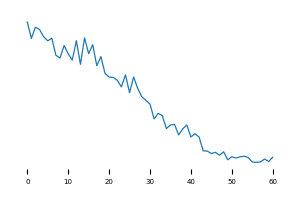
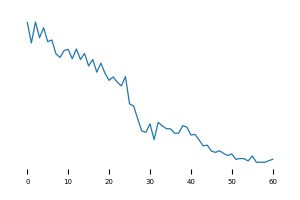
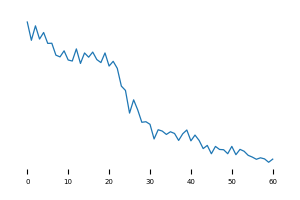
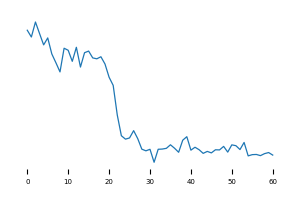
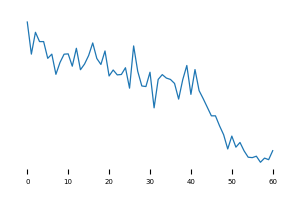
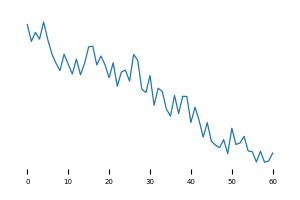

NHS England Low Priority Treatment - co-proxamol


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3920.91rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - dosulepin


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3649.14rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BASILDON AND BRENTWOOD,2018-11-01,-0.085218,
NHS KNOWSLEY,2018-11-01,-0.831954,
NHS NORFOLK AND WAVENEY,2018-11-01,-1.040049,
NHS WARRINGTON,2018-11-01,-1.321256,
NHS BLACKBURN WITH DARWEN,2018-11-01,-1.327569,
NHS WIRRAL,2018-11-01,-1.531162,
NHS WEST SUSSEX,2018-11-01,-1.582252,
NHS FYLDE AND WYRE,2018-11-01,-1.636552,
NHS ST HELENS,2018-11-01,-1.716370,

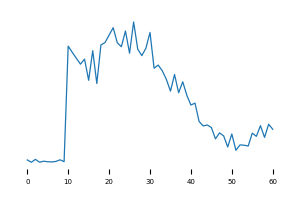
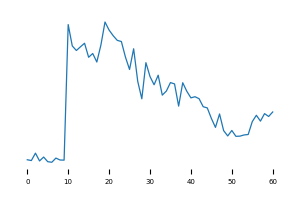
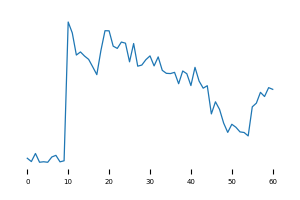
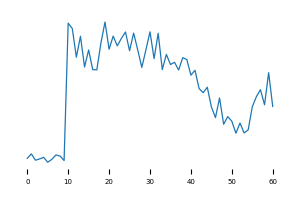
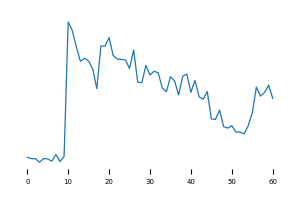
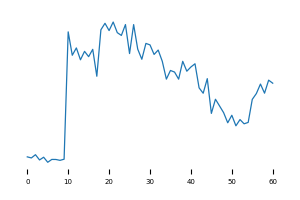
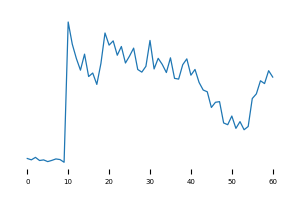
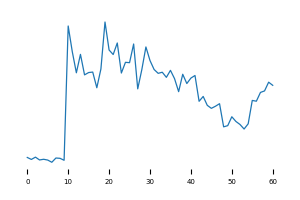
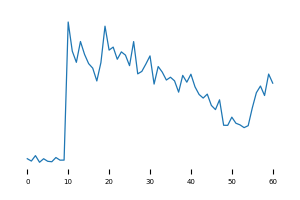
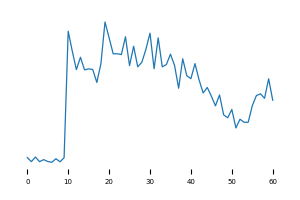

NHS England Low Priority Treatment - doxazosin modified release


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3004.31rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS NORTH EAST ESSEX,2019-01-01,0.671705,
NHS TAMESIDE AND GLOSSOP,2018-04-01,0.436937,

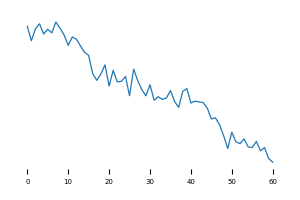
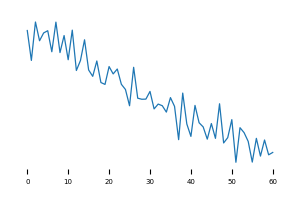

NHS England Low Priority Treatment - Dronedarone


Downloading: 100%|██████████| 457/457 [00:00<00:00, 2694.78rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS IPSWICH AND EAST SUFFOLK,2018-07-01,0.626063,
NHS EAST LANCASHIRE,2018-12-01,0.245512,

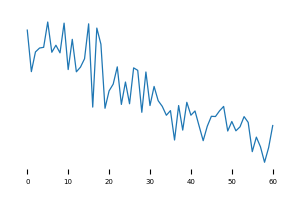
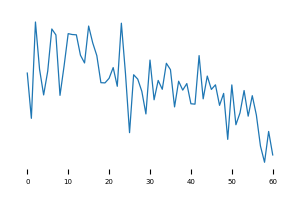

NHS England Low Priority Treatment - fentanyl immediate release


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3913.37rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS COUNTY DURHAM,2020-10-01,0.749034,

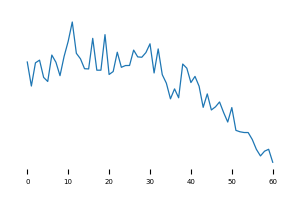

NHS England Low Priority Treatment - glucosamine and chondroitin


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4079.55rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - herbal medicines


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4161.64rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - homeopathy


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4033.25rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - lidocaine plasters


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3913.92rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS DEVON,2020-04-01,0.411615,
NHS LEICESTER CITY,2019-06-01,0.138656,

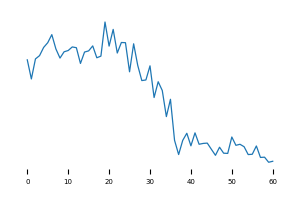
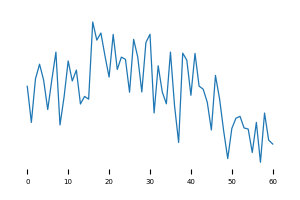

NHS England Low Priority Treatment - liothyronine (including Armour Thyroid and liothyronine combination products)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3881.75rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
"NHS HAMPSHIRE, SOUTHAMPTON AND ISLE OF WIGHT",2018-11-01,0.588475,

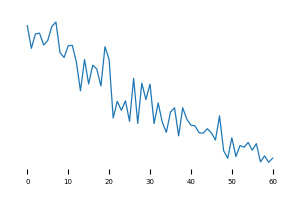

NHS England Low Priority Treatment - lutein and antioxidants


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3683.01rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - Minocycline


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3786.18rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - Higher Cost Insulin Pen Needles


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3789.84rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BARNSLEY,2019-04-01,0.843945,
NHS BIRMINGHAM AND SOLIHULL,2019-02-01,0.741183,
NHS LEICESTER CITY,2020-08-01,0.733842,
"NHS HEYWOOD, MIDDLETON AND ROCHDALE",2018-11-01,0.730510,
NHS DONCASTER,2019-02-01,0.725100,
NHS SOUTHEND,2018-11-01,0.706142,
NHS BASSETLAW,2019-08-01,0.693819,
NHS NORTH STAFFORDSHIRE,2019-03-01,0.674218,
NHS OLDHAM,2019-12-01,0.670978,

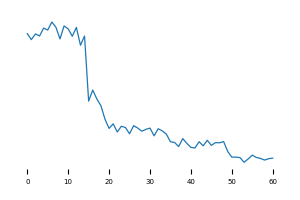
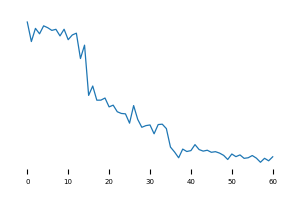
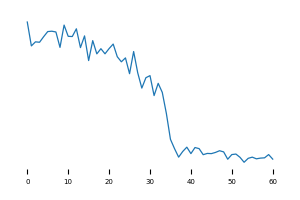
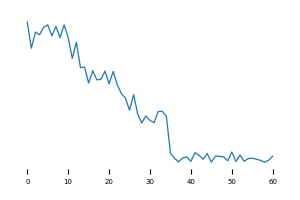
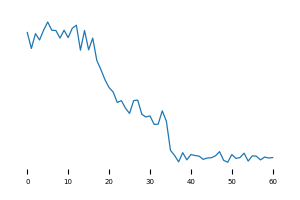
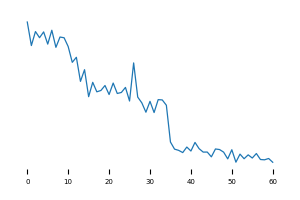
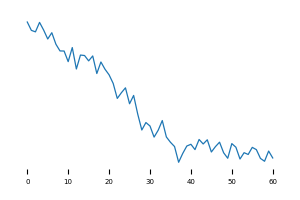
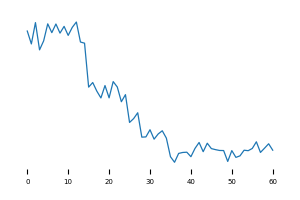
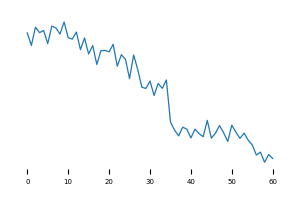
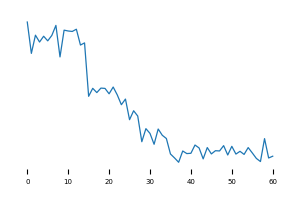

NHS England Low Priority Treatment - omega-3 fatty acid compounds


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4562.89rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS ROTHERHAM,2020-08-01,0.702035,

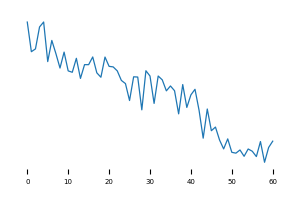

NHS England Low Priority Treatment - oxycodone and naloxone combination product


Downloading: 100%|██████████| 457/457 [00:00<00:00, 5150.33rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS STOKE ON TRENT,2018-06-01,0.713495,
NHS DEVON,2019-08-01,0.647590,
NHS IPSWICH AND EAST SUFFOLK,2018-11-01,0.627838,

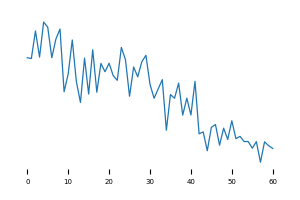
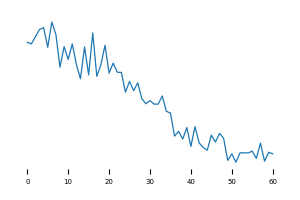
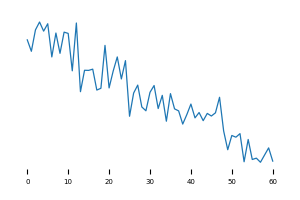

NHS England Low Priority Treatment - perindopril arginine


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4679.44rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BARNSLEY,2019-11-01,0.800890,
NHS KENT AND MEDWAY,2018-04-01,0.631084,
"NHS HEYWOOD, MIDDLETON AND ROCHDALE",2019-01-01,0.394143,
NHS NORTH EAST ESSEX,2019-11-01,0.321904,

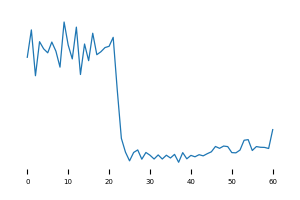
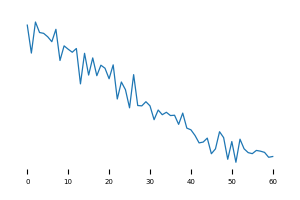
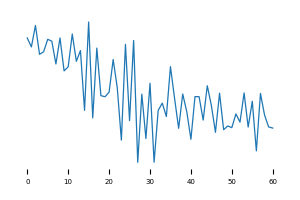
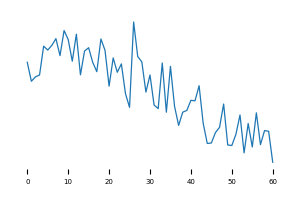

NHS England Low Priority Treatment - rubefacients


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3349.08rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BARNSLEY,2019-09-01,0.896039,
NHS SOUTHPORT AND FORMBY,2019-05-01,0.882850,
NHS EAST LANCASHIRE,2019-10-01,0.798515,
NHS WEST LEICESTERSHIRE,2018-05-01,0.694177,
NHS KNOWSLEY,2019-05-01,0.657116,
NHS LIVERPOOL,2019-09-01,0.568584,
NHS BOLTON,2018-11-01,0.503736,

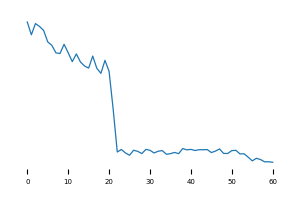
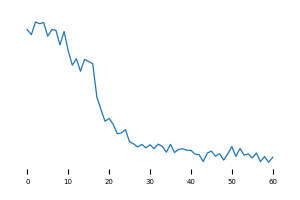
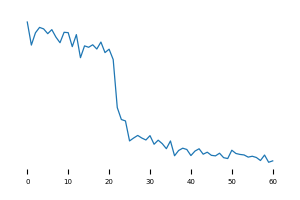
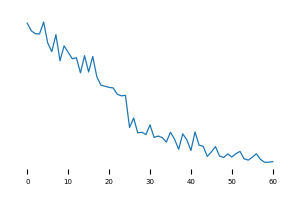
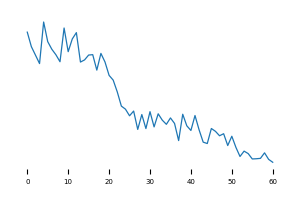
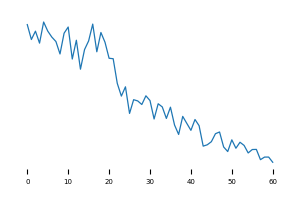
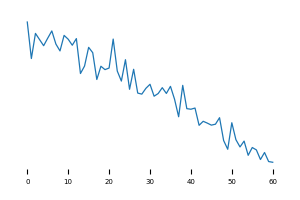

NHS England Low Priority Treatment - Silk Garments


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4163.69rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - tadalafil once daily


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3972.97rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - paracetamol and tramadol combination


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4462.11rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - travel vaccines


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4288.38rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


NHS England Low Priority Treatment - trimipramine


Downloading: 100%|██████████| 457/457 [00:00<00:00, 5198.09rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BARNSLEY,2019-09-01,0.867981,
NHS KENT AND MEDWAY,2019-05-01,0.495123,
NHS EAST AND NORTH HERTFORDSHIRE,2018-12-01,0.341185,

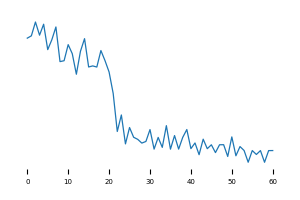
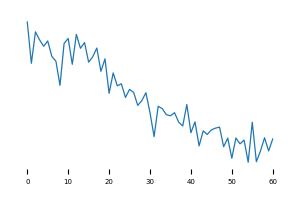
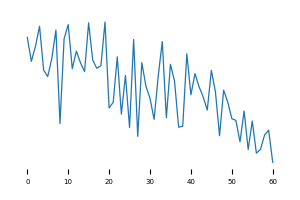

NHS England Low Priority Treatment - All Low Priority Treatments


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4093.97rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BARNSLEY,2019-04-01,0.740634,
NHS KERNOW,2019-02-01,0.567609,
NHS DEVON,2018-11-01,0.547554,

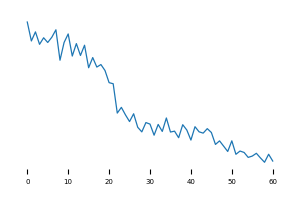
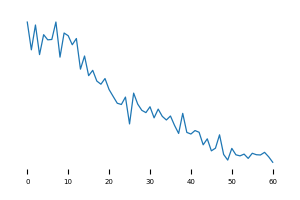
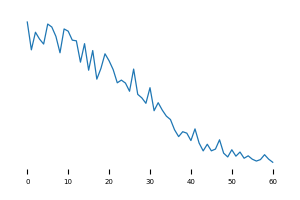

Pregabalin capsules prescribed as Lyrica


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4149.16rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS EAST STAFFORDSHIRE,2018-09-01,0.900354,

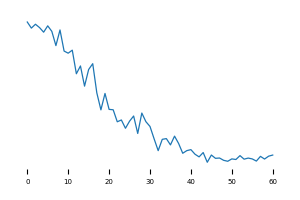

Methotrexate 10 mg tablets 


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4939.23rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS KENT AND MEDWAY,2018-12-01,0.996669,
NHS SOUTHEND,2021-11-01,0.987355,
NHS LEICESTER CITY,2020-12-01,0.961076,
NHS NORTH CENTRAL LONDON,2019-02-01,0.944006,
NHS SOUTH EAST LONDON,2020-09-01,0.927135,
NHS EAST SUSSEX,2018-03-01,0.921967,
NHS NORTH WEST LONDON,2019-01-01,0.839570,
NHS BERKSHIRE WEST,2019-12-01,0.838505,
NHS NORTHAMPTONSHIRE,2020-10-01,0.819559,

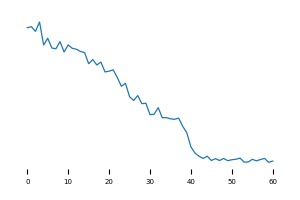
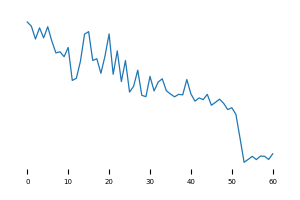
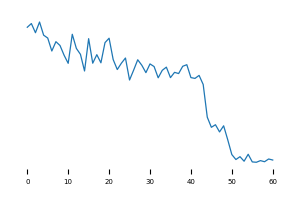
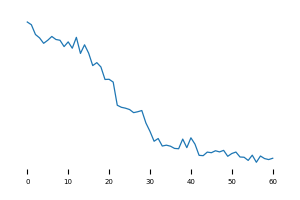
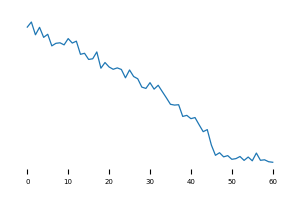
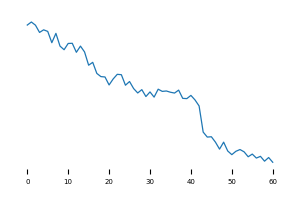
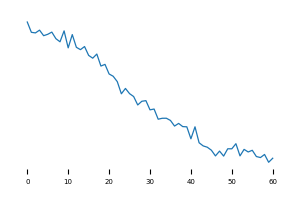
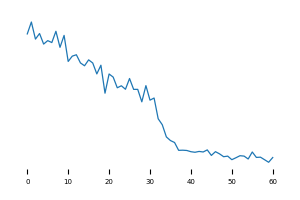
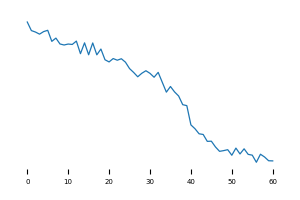
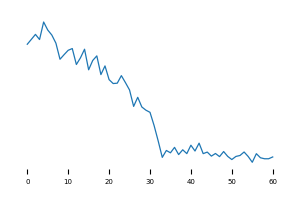

Prescribing of nimodipine


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3927.64rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Prescribing of opioids (total oral morphine equivalence)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4306.43rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SUNDERLAND,2018-04-01,0.338777,
NHS NORTHUMBERLAND,2018-06-01,0.331909,
NHS TEES VALLEY,2019-02-01,0.249720,
NHS COUNTY DURHAM,2018-11-01,0.249151,
NHS DONCASTER,2018-04-01,0.238832,
NHS TAMESIDE AND GLOSSOP,2018-09-01,0.234340,
NHS HULL,2018-04-01,0.187326,
NHS WIGAN BOROUGH,2019-03-01,0.184947,
NHS BASSETLAW,2018-04-01,0.172565,

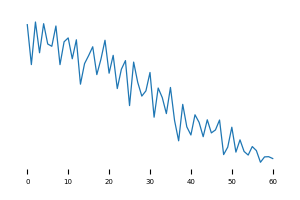
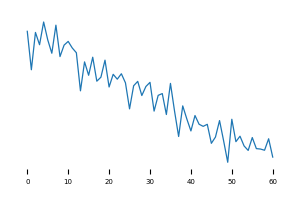
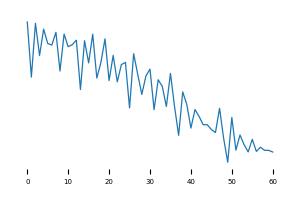
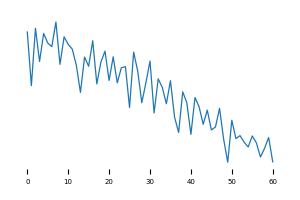
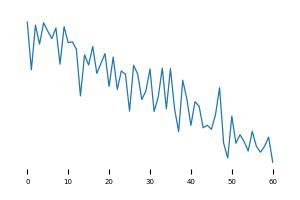
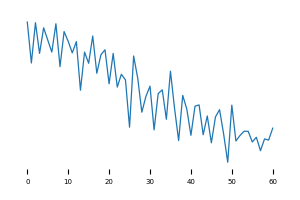
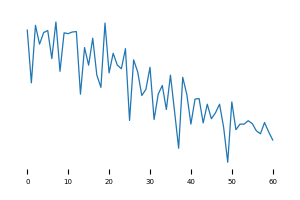
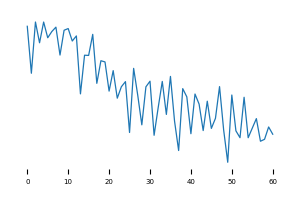
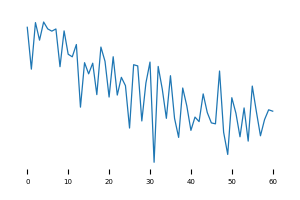
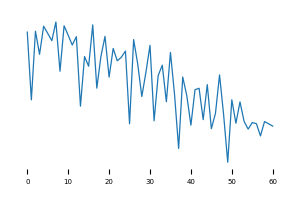

High dose opioids per 1000 patients


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4064.02rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SUNDERLAND,2019-06-01,0.525221,
NHS TEES VALLEY,2018-06-01,0.508426,
NHS BURY,2020-08-01,0.501489,
NHS COUNTY DURHAM,2018-04-01,0.471192,
NHS DONCASTER,2019-01-01,0.446880,
NHS WAKEFIELD,2018-04-01,0.379640,
NHS TAMESIDE AND GLOSSOP,2019-09-01,0.368544,
NHS BLACKBURN WITH DARWEN,2019-09-01,0.352966,
NHS HULL,2020-01-01,0.352534,

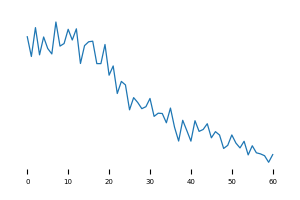
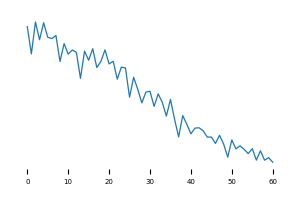
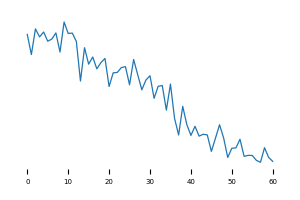
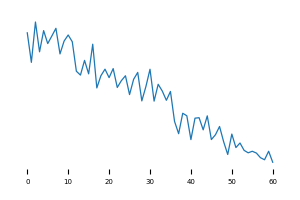
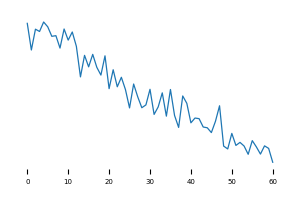
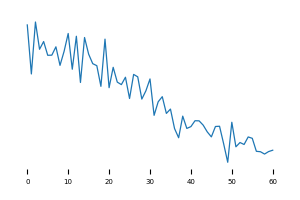
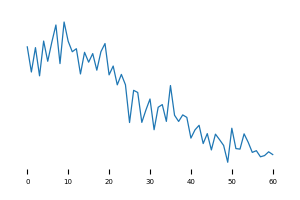
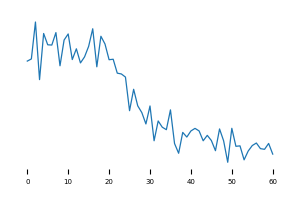
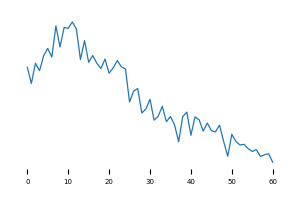
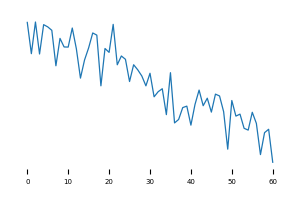

High dose opioid items as percentage regular opioids


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3658.77rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BURY,2020-08-01,0.416638,
NHS FRIMLEY,2018-08-01,0.397088,
NHS CHESHIRE,2018-06-01,0.375732,
NHS TEES VALLEY,2018-05-01,0.355307,
NHS WAKEFIELD,2018-10-01,0.349388,
NHS SOUTHEND,2018-07-01,0.344496,
NHS NORTH CUMBRIA,2018-02-01,0.338555,
NHS BOLTON,2018-08-01,0.328204,
NHS BUCKINGHAMSHIRE,2020-04-01,0.196170,

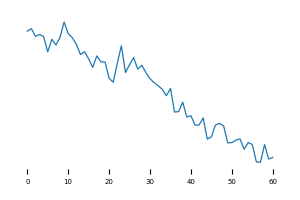
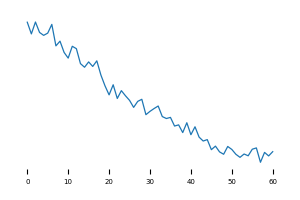
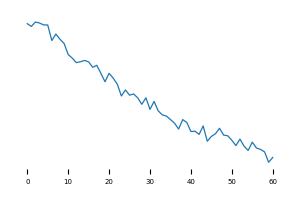
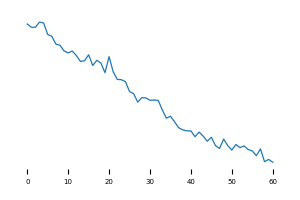
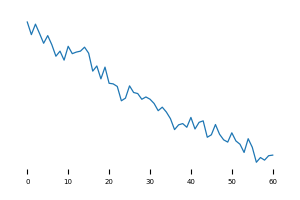
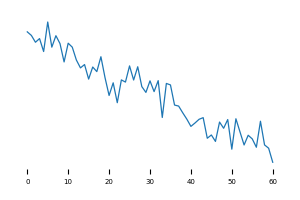
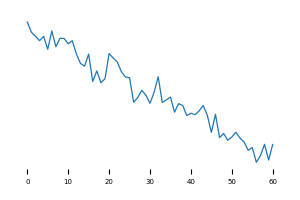
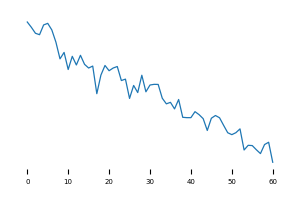
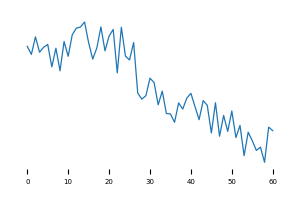
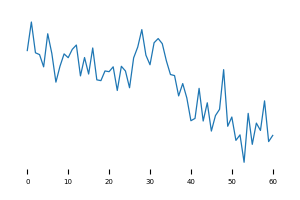

Other lipid-modifying drugs


Downloading: 100%|██████████| 457/457 [00:00<00:00, 1241.04rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS ROTHERHAM,2019-07-01,-0.210860,
NHS LIVERPOOL,2019-03-01,-0.226648,
NHS EAST SUSSEX,2018-10-01,-0.332786,
NHS KERNOW,2019-05-01,-0.349660,
NHS NORTH CUMBRIA,2019-07-01,-0.363687,
NHS STOKE ON TRENT,2019-07-01,-0.439323,
NHS NEWCASTLE GATESHEAD,2019-10-01,-0.509368,
NHS SUNDERLAND,2019-01-01,-0.616965,

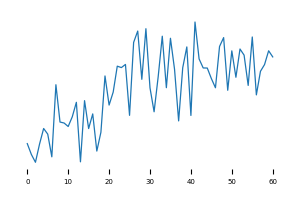
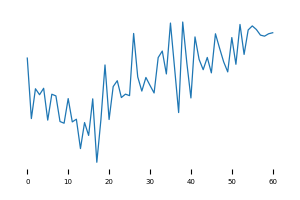
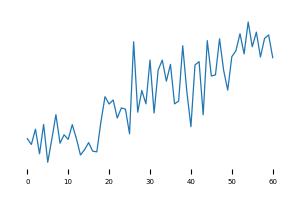
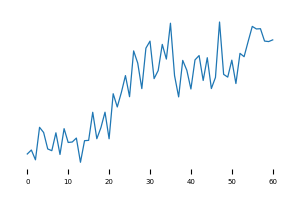
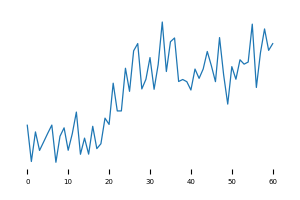
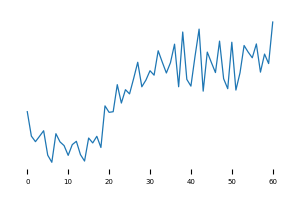
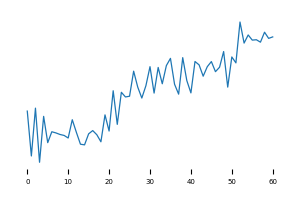
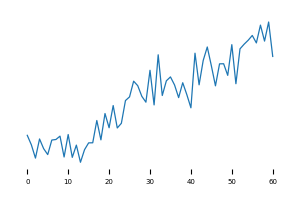

High-cost PPIs


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3892.55rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SHEFFIELD,2021-11-01,0.456171,
NHS CALDERDALE,2020-12-01,0.386026,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2018-02-01,0.359093,
NHS NORTH EAST ESSEX,2019-11-01,0.352486,
NHS DORSET,2019-03-01,0.211585,

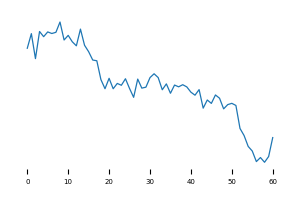
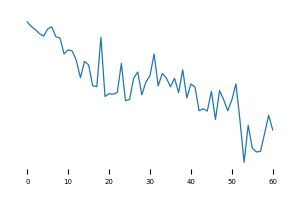
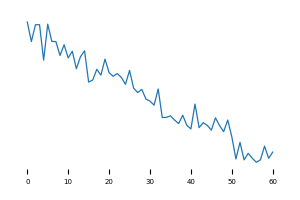
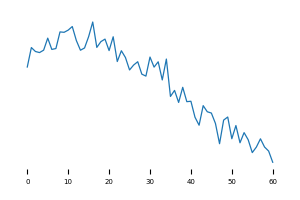
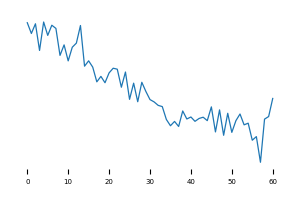

Higher dose Proton Pump Inhibitors (PPIs)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3589.10rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS WIGAN BOROUGH,2019-02-01,0.052543,
NHS NORTHAMPTONSHIRE,2019-10-01,0.042059,
NHS NORTH WEST LONDON,2021-11-01,0.032891,
NHS STAFFORD AND SURROUNDS,2019-12-01,0.029869,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2019-05-01,0.028983,
NHS TRAFFORD,2018-09-01,0.026221,
NHS WARRINGTON,2019-05-01,0.024030,
NHS IPSWICH AND EAST SUFFOLK,2021-11-01,0.019314,
NHS BLACKPOOL,2020-04-01,0.018446,

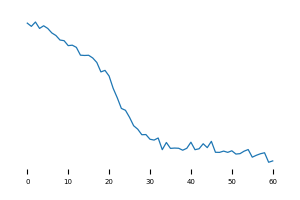
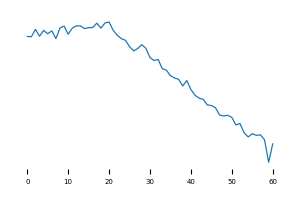
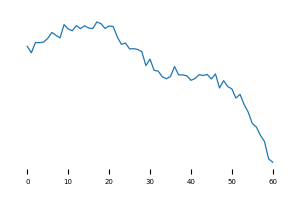
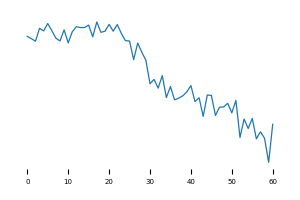
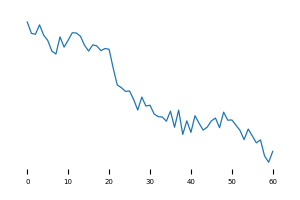
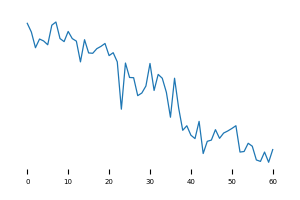
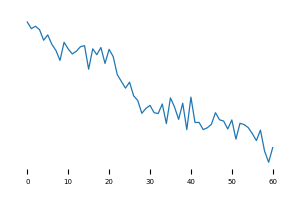
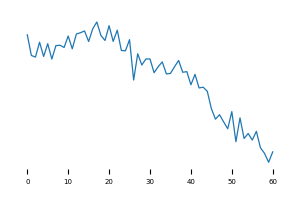
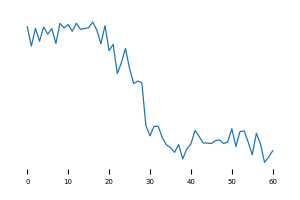
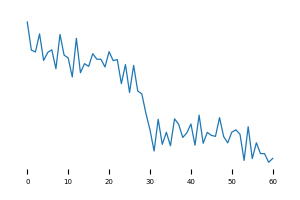

Prescribing of pregabalin


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4778.10rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS DEVON,2019-08-01,-0.070556,
NHS NORTH EAST ESSEX,2018-03-01,-0.125193,
NHS TRAFFORD,2018-03-01,-0.177317,
NHS NORFOLK AND WAVENEY,2018-03-01,-0.247656,
NHS WIGAN BOROUGH,2018-03-01,-0.256291,
NHS TEES VALLEY,2018-03-01,-0.262746,
NHS MANCHESTER,2018-03-01,-0.276287,
NHS HALTON,2018-10-01,-0.277105,
NHS LINCOLNSHIRE,2018-03-01,-0.279400,

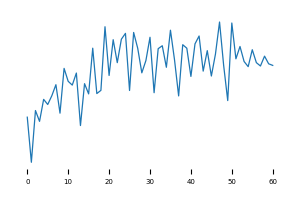
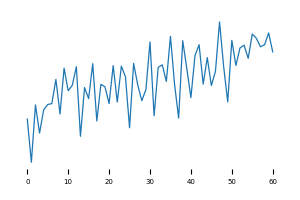
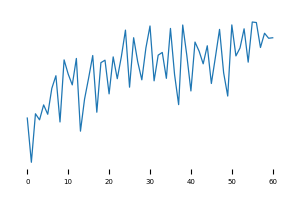
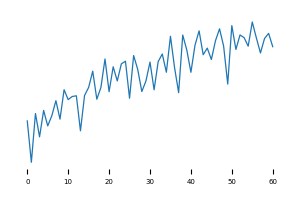
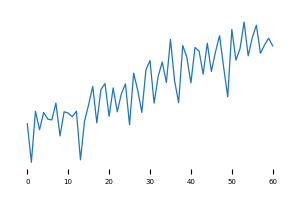
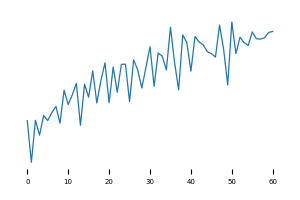
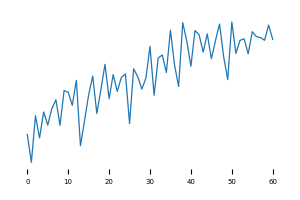
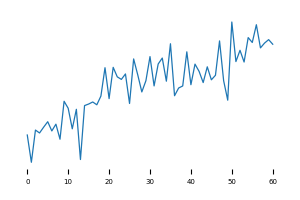
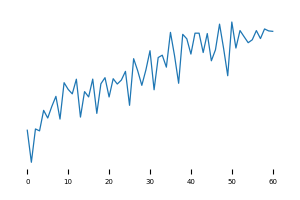
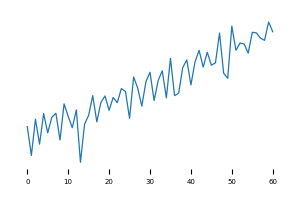

Prescribing of pregabalin (total mg)


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3806.64rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS NORTH EAST ESSEX,2018-03-01,-0.100812,
NHS OLDHAM,2018-03-01,-0.124433,
NHS TEES VALLEY,2018-03-01,-0.167917,
NHS WAKEFIELD,2018-03-01,-0.196248,
NHS LINCOLNSHIRE,2018-03-01,-0.204368,
NHS SOUTHPORT AND FORMBY,2018-03-01,-0.234289,
NHS BASSETLAW,2018-03-01,-0.281328,
NHS WEST LANCASHIRE,2018-03-01,-0.315610,
NHS KNOWSLEY,2018-03-01,-0.337003,

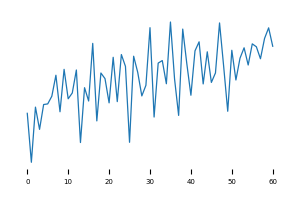
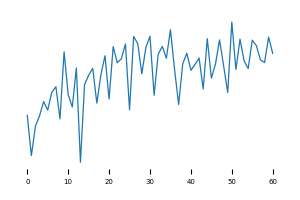
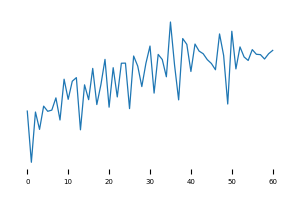
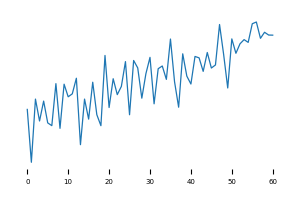
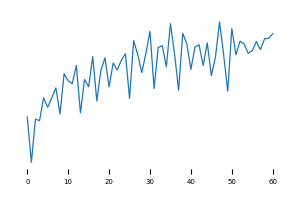
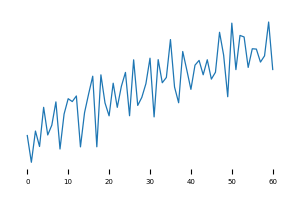
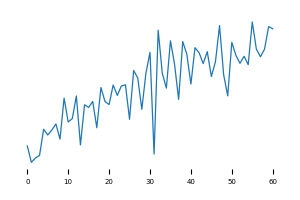
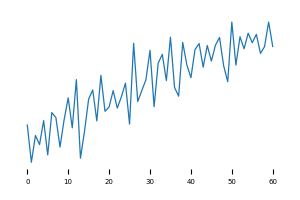
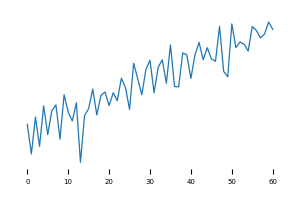
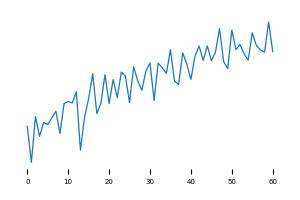

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3695.35rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SALFORD,2018-12-01,0.369686,
NHS CALDERDALE,2021-03-01,0.331981,
NHS WEST ESSEX,2018-01-01,0.291552,
NHS BERKSHIRE WEST,2018-10-01,0.250793,
NHS SOMERSET,2021-06-01,0.230097,
NHS KIRKLEES,2020-09-01,0.226445,
NHS NORFOLK AND WAVENEY,2020-07-01,0.204641,
NHS COVENTRY AND WARWICKSHIRE,2020-12-01,0.156781,
NHS EAST STAFFORDSHIRE,2019-10-01,0.155367,

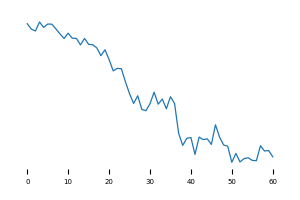
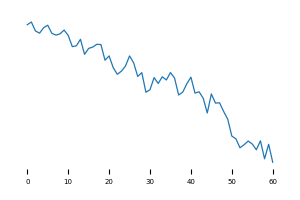
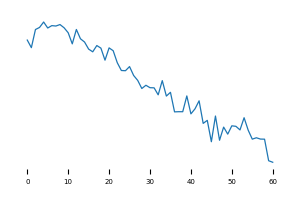
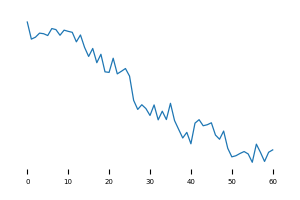
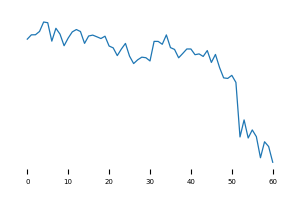
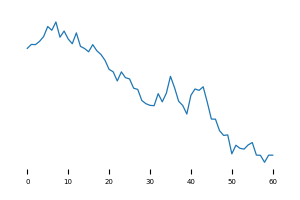
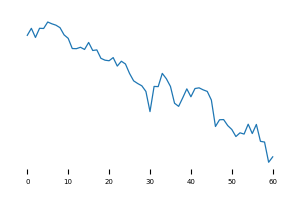
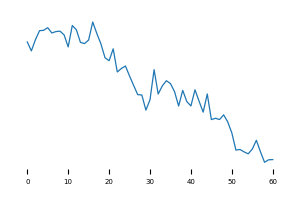
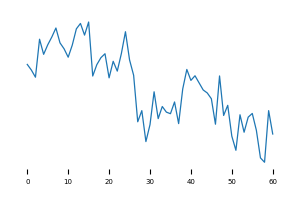
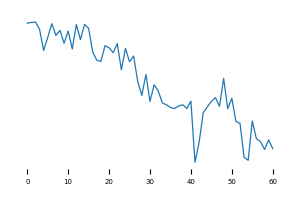

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3708.35rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS HEREFORDSHIRE AND WORCESTERSHIRE,2019-09-01,-0.377681,
NHS MORECAMBE BAY,2019-04-01,-0.436908,
NHS SOUTHEND,2019-04-01,-0.784116,
NHS HULL,2019-09-01,-2.384884,
NHS HALTON,2020-08-01,-3.290190,
NHS DERBY AND DERBYSHIRE,2018-06-01,-6.371515,
NHS EAST SUSSEX,2018-12-01,-23.407829,
NHS TRAFFORD,2018-03-01,-24.496561,
NHS SOUTHPORT AND FORMBY,2018-09-01,-41.713254,

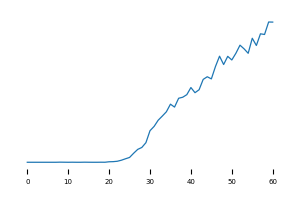
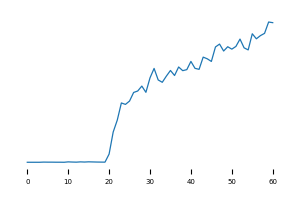
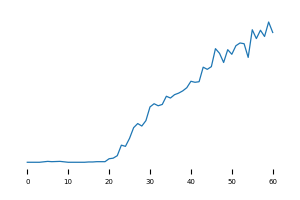
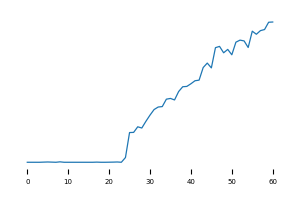
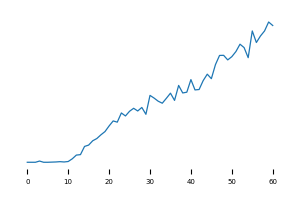
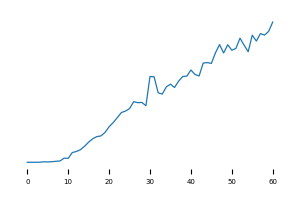
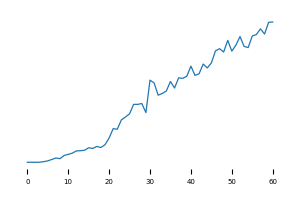
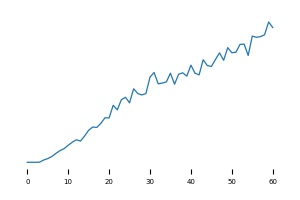
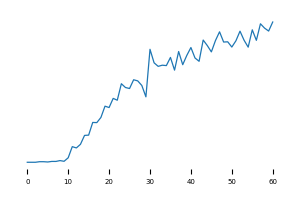
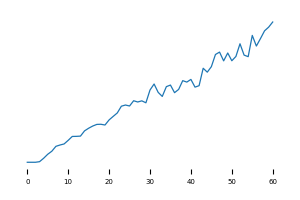

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 2175.38rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS EAST SUSSEX,2018-10-01,0.123441,
NHS NORTH EAST ESSEX,2018-10-01,0.116095,
NHS WEST SUSSEX,2018-10-01,0.092391,
NHS CALDERDALE,2018-05-01,0.077650,
NHS WIGAN BOROUGH,2018-10-01,0.071665,
NHS ST HELENS,2018-09-01,0.064433,
NHS WEST LANCASHIRE,2018-10-01,0.033848,
NHS HALTON,2018-10-01,0.023899,
NHS LEEDS,2018-10-01,0.017856,

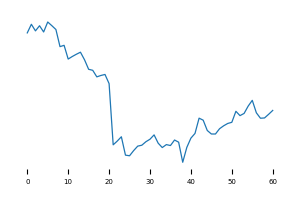
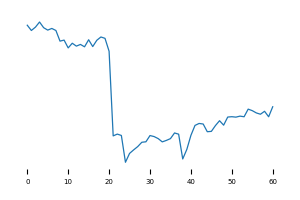
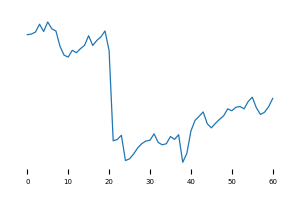
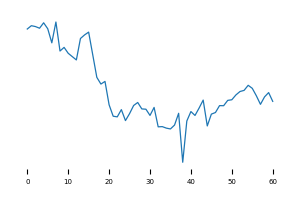
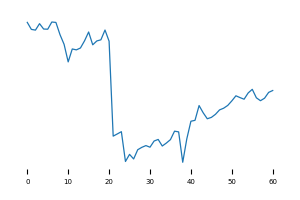
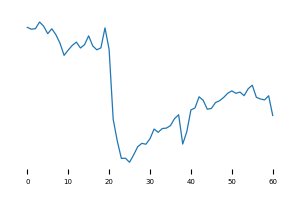
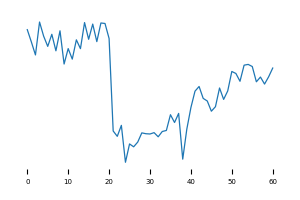
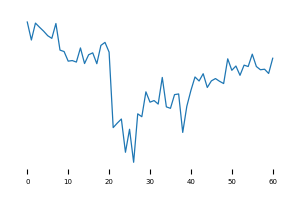
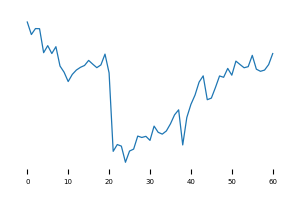
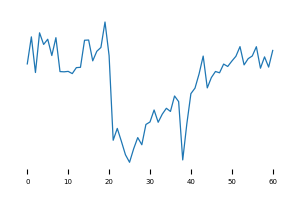

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3813.88rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS NORTHUMBERLAND,2018-09-01,0.241776,
NHS NEWCASTLE GATESHEAD,2018-02-01,0.165347,
NHS TEES VALLEY,2017-03-01,-0.112059,
NHS WEST LANCASHIRE,2017-03-01,-0.220702,
NHS LIVERPOOL,2017-03-01,-0.223818,
NHS BARNSLEY,2017-03-01,-0.320101,
NHS BLACKPOOL,2017-03-01,-0.376960,

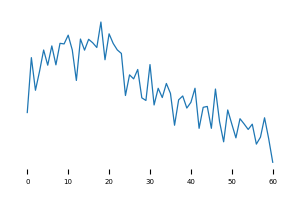
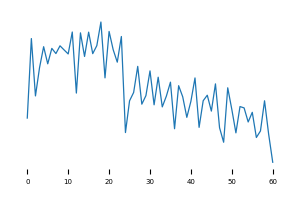
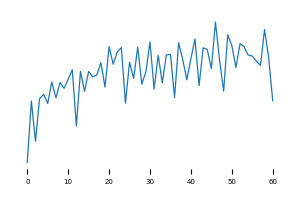
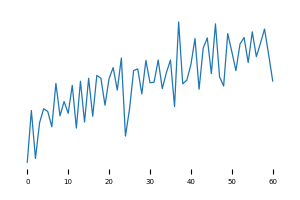
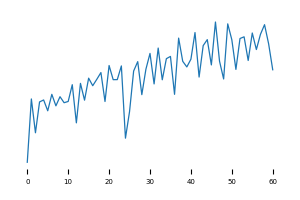
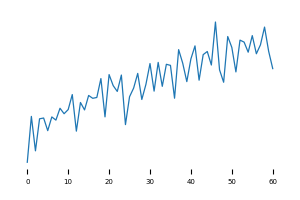
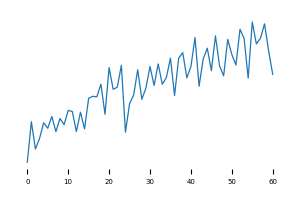

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4029.61rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
"NHS HEYWOOD, MIDDLETON AND ROCHDALE",2018-01-01,0.252129,
NHS DORSET,2018-04-01,0.228212,
"NHS HAMPSHIRE, SOUTHAMPTON AND ISLE OF WIGHT",2018-05-01,0.104492,
NHS NORTHAMPTONSHIRE,2020-03-01,0.090215,
NHS SOUTH EAST LONDON,2017-04-01,0.084287,

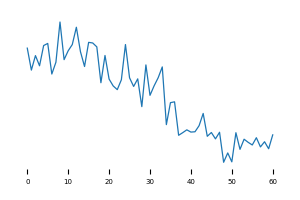
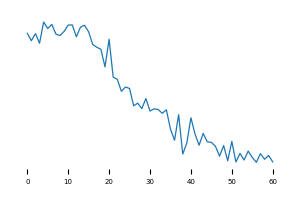
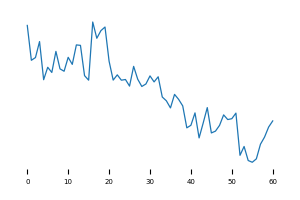
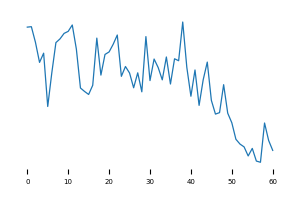
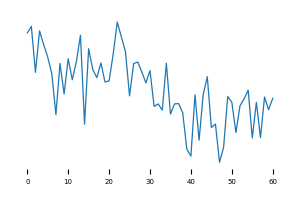

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3963.72rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOUTH SEFTON,2019-07-01,-0.543247,
NHS HALTON,2018-03-01,-0.653378,

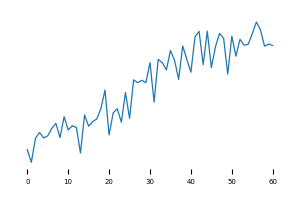
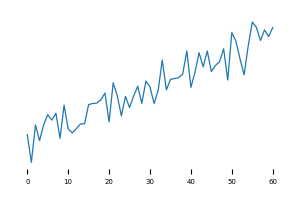

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3933.52rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOUTH TYNESIDE,2018-07-01,0.502741,
"NHS HEYWOOD, MIDDLETON AND ROCHDALE",2018-07-01,0.447548,
NHS BURY,2020-08-01,0.417070,
NHS DORSET,2019-12-01,0.407201,
NHS NORTHUMBERLAND,2018-05-01,0.403708,
NHS FRIMLEY,2018-04-01,0.385682,
NHS TEES VALLEY,2019-07-01,0.349274,
NHS MORECAMBE BAY,2018-12-01,0.302354,
NHS NORTH CUMBRIA,2018-02-01,0.295082,

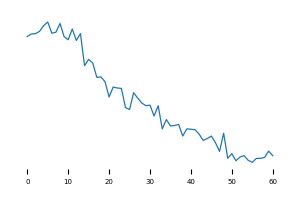
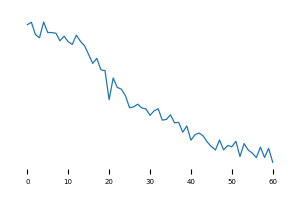
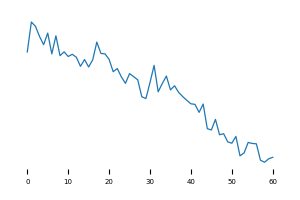
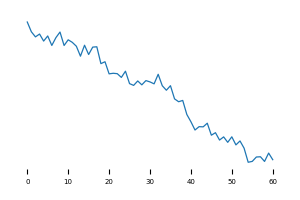
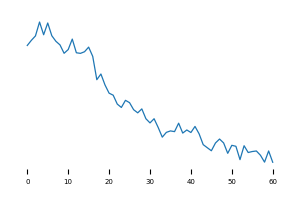
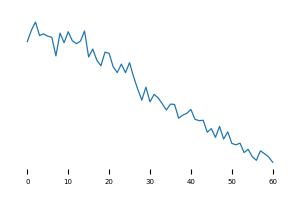
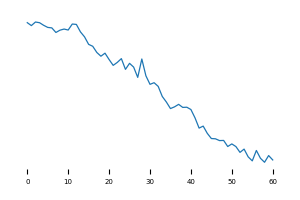
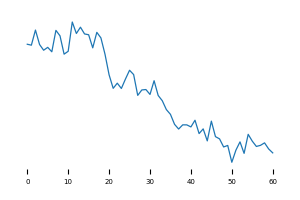
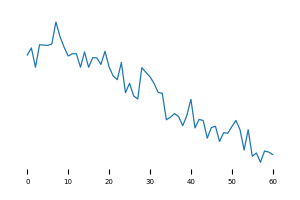
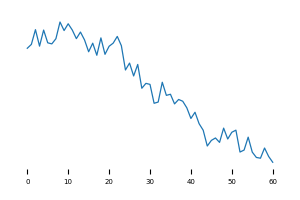

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3903.59rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4083.66rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS DEVON,2017-03-01,-0.128494,
"NHS HEYWOOD, MIDDLETON AND ROCHDALE",2017-03-01,-0.137460,
NHS SUNDERLAND,2017-03-01,-0.143494,
NHS NORTH EAST ESSEX,2017-03-01,-0.199654,
NHS COUNTY DURHAM,2017-03-01,-0.220893,
NHS OLDHAM,2017-03-01,-0.265197,
NHS TEES VALLEY,2017-03-01,-0.304630,
NHS LINCOLNSHIRE,2017-03-01,-0.318310,
NHS WEST LANCASHIRE,2017-03-01,-0.429339,

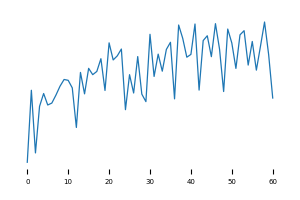
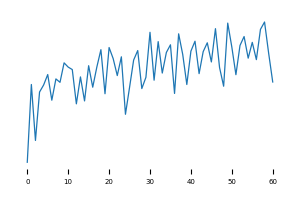
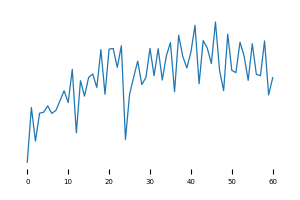
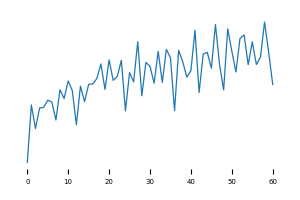
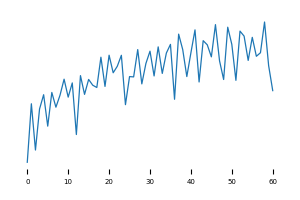
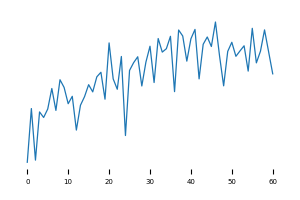
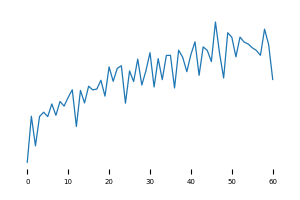
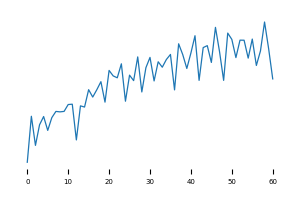
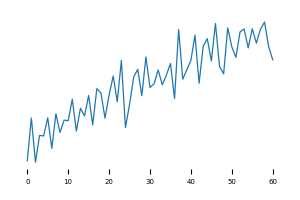
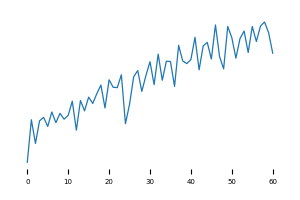

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4142.00rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS PORTSMOUTH,2018-09-01,-0.396421,
NHS BRADFORD DISTRICT AND CRAVEN,2017-12-01,-0.409369,
NHS MORECAMBE BAY,2020-01-01,-0.414575,
NHS BERKSHIRE WEST,2020-01-01,-0.447746,
NHS NORTH CENTRAL LONDON,2019-10-01,-0.668559,
NHS ROTHERHAM,2017-11-01,-0.751979,

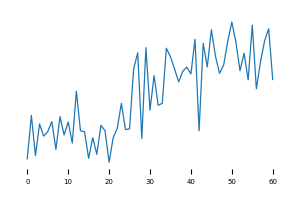
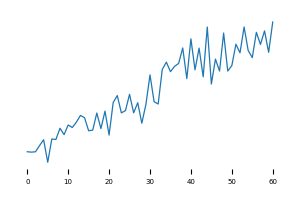
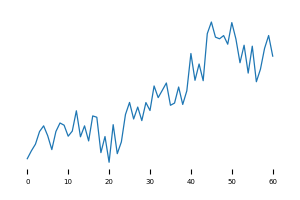
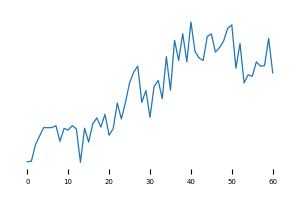
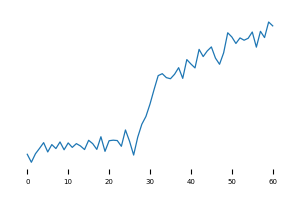
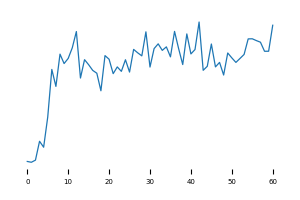

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 2842.23rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS WEST SUFFOLK,2019-11-01,-0.024470,
NHS KIRKLEES,2019-11-01,-0.024768,
NHS LEEDS,2019-10-01,-0.041721,
"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES",2019-10-01,-0.047361,
"NHS BATH AND NORTH EAST SOMERSET, SWINDON AND WILTSHIRE",2019-10-01,-0.058769,
NHS CAMBRIDGESHIRE AND PETERBOROUGH,2019-10-01,-0.060334,
NHS BURY,2020-04-01,-0.078040,
NHS WEST LEICESTERSHIRE,2019-10-01,-0.085783,
NHS NOTTINGHAM AND NOTTINGHAMSHIRE,2019-10-01,-0.091483,

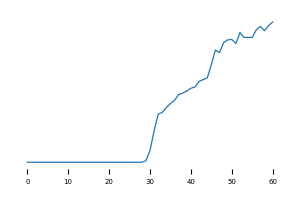
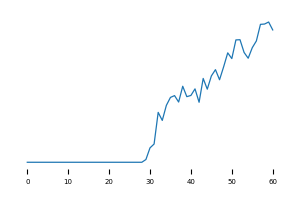
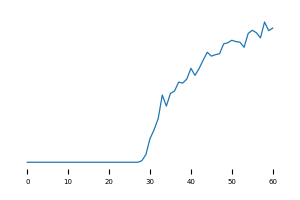
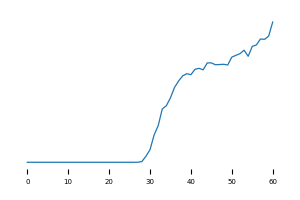
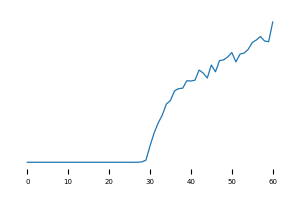
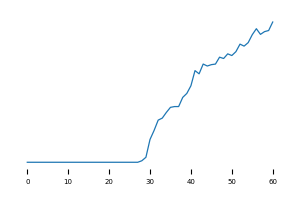
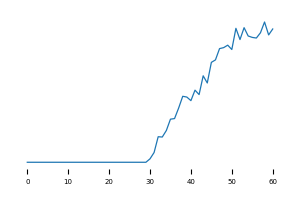
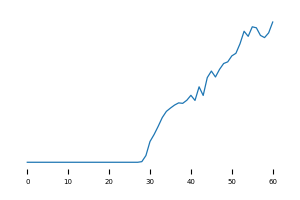
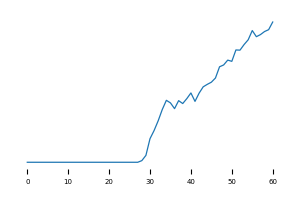
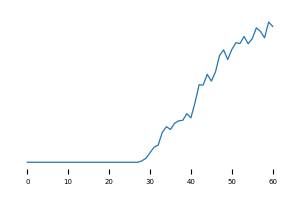

nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4951.17rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


nan


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4637.52rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BASILDON AND BRENTWOOD,2019-10-01,0.184965,
NHS ROTHERHAM,2019-06-01,0.179070,
NHS THURROCK,2019-05-01,0.128766,
NHS WEST ESSEX,2019-04-01,0.083213,

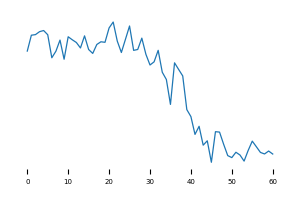
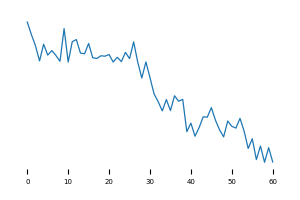
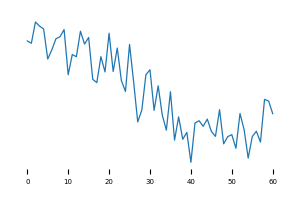
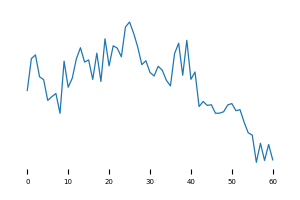

Probiotics that have been removed from the drug tariff


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4665.89rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Short acting beta agonist inhalers


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3834.02rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS CALDERDALE,2019-05-01,0.123618,
NHS NORTH TYNESIDE,2020-04-01,0.110498,
NHS HULL,2021-11-01,0.082343,
NHS TEES VALLEY,2020-04-01,0.070473,
NHS COUNTY DURHAM,2020-04-01,0.058332,
NHS SOUTH EAST LONDON,2020-04-01,0.056139,
NHS WAKEFIELD,2020-04-01,0.052852,
NHS KIRKLEES,2020-04-01,0.047001,
NHS NEWCASTLE GATESHEAD,2020-04-01,0.045196,

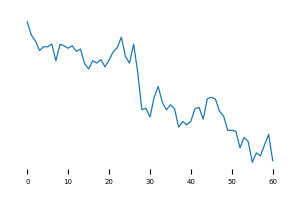
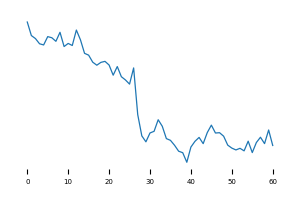
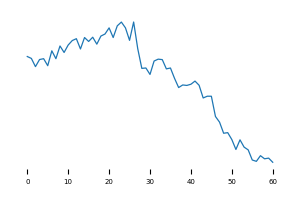
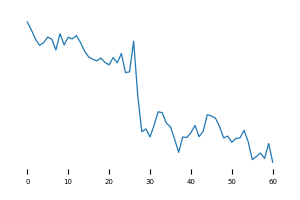
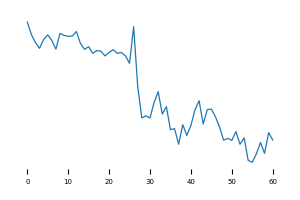
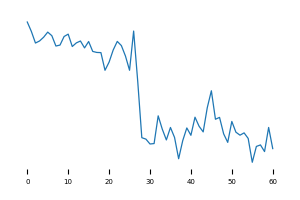
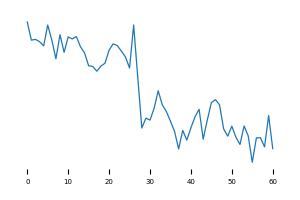
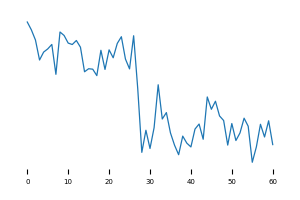
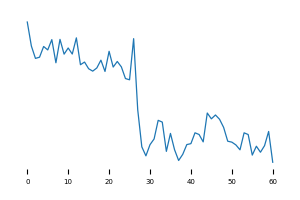
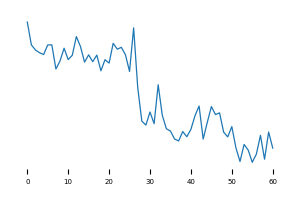

Possible excess quantities of semaglutide


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4759.67rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS CANNOCK CHASE,2019-11-01,-0.133171,

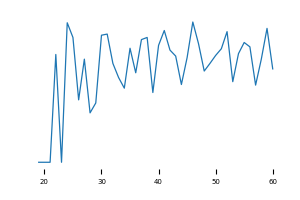

Seven Day Prescribing for Long Term Conditions


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3006.21rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
"NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCESTERSHIRE",2019-01-01,0.463091,
NHS LEEDS,2020-03-01,0.144161,
NHS TRAFFORD,2020-02-01,0.128385,
NHS NORTH CENTRAL LONDON,2020-04-01,-0.211075,
NHS SOUTH TYNESIDE,2018-02-01,-0.222929,
NHS CALDERDALE,2019-01-01,-0.223520,

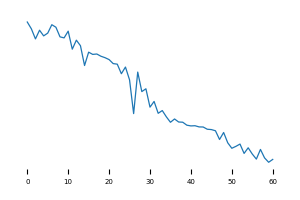
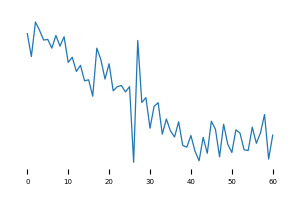
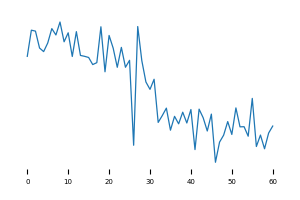
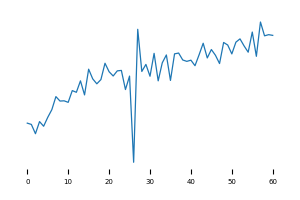
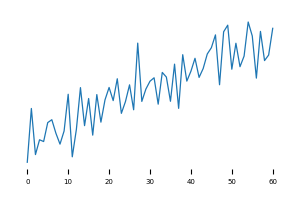
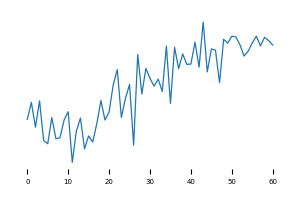

High-cost drugs for erectile dysfunction


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3651.79rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Silver dressings


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3487.58rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2019-12-01,0.489075,

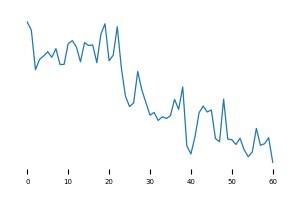

Soluble/effervescent forms of paracetamol and co-codamol


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3927.84rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS DORSET,2019-02-01,0.540254,
NHS BASSETLAW,2021-10-01,0.399145,
NHS EAST RIDING OF YORKSHIRE,2021-11-01,0.370935,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2021-11-01,0.341962,
NHS HULL,2021-11-01,0.341914,
NHS WARRINGTON,2021-11-01,0.335270,
NHS CANNOCK CHASE,2019-05-01,0.308369,
NHS NORTH LINCOLNSHIRE,2021-11-01,0.287000,
NHS EAST LANCASHIRE,2021-11-01,0.278288,

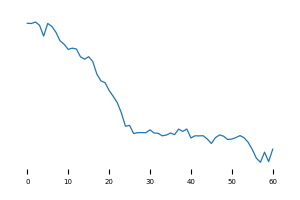
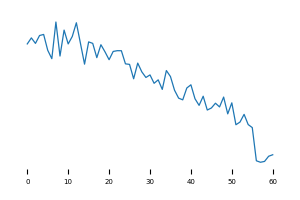
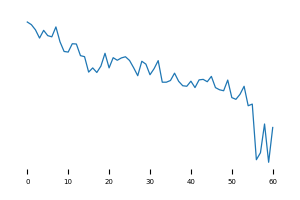
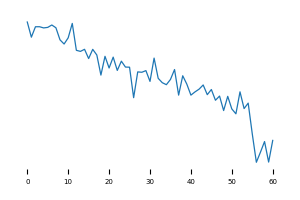
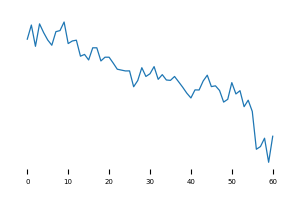
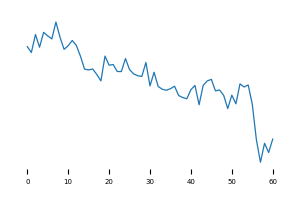
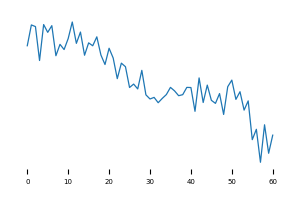
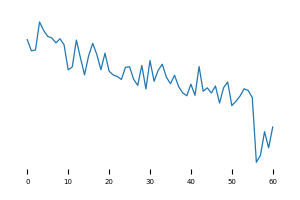
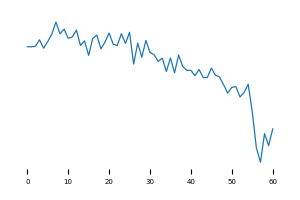
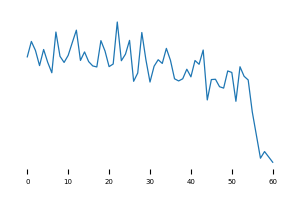

Low and medium intensity statins


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3276.32rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOMERSET,2020-08-01,0.560974,
NHS MORECAMBE BAY,2018-02-01,0.408166,
NHS GLOUCESTERSHIRE,2020-11-01,0.404447,
"NHS BEDFORDSHIRE, LUTON AND MILTON KEYNES",2020-08-01,0.401417,
NHS DERBY AND DERBYSHIRE,2018-02-01,0.388067,
NHS KERNOW,2018-02-01,0.383968,
NHS CANNOCK CHASE,2018-02-01,0.382830,
NHS DORSET,2018-02-01,0.378056,
NHS BUCKINGHAMSHIRE,2020-10-01,0.365616,

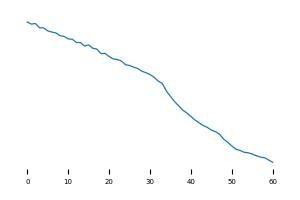
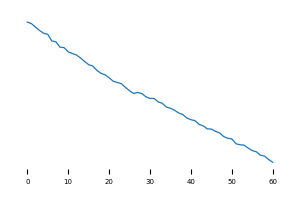
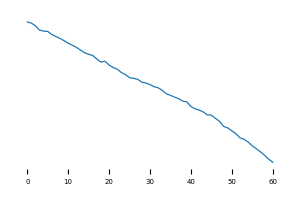
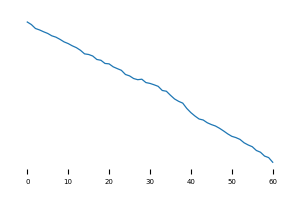
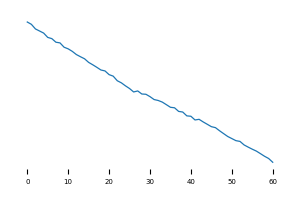
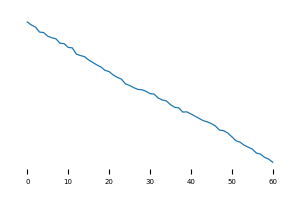
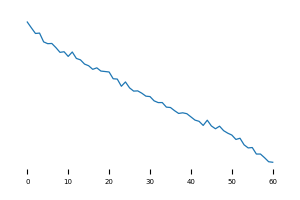
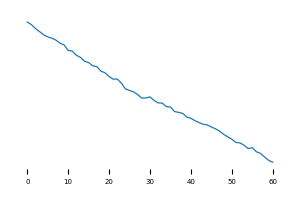
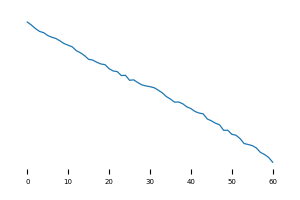
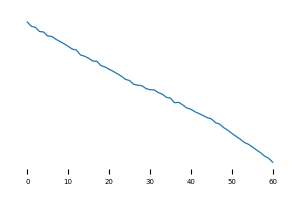

Prescribing of tamoxifen


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3632.09rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS BLACKPOOL,2019-11-01,0.463335,
NHS CAMBRIDGESHIRE AND PETERBOROUGH,2018-09-01,0.331276,
NHS NORTH STAFFORDSHIRE,2018-09-01,0.309620,
NHS CHESHIRE,2018-12-01,0.300119,
NHS EAST AND NORTH HERTFORDSHIRE,2019-09-01,0.181890,

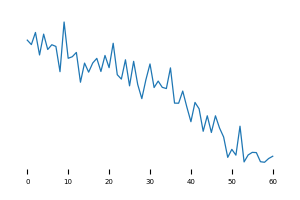
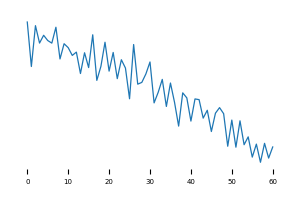
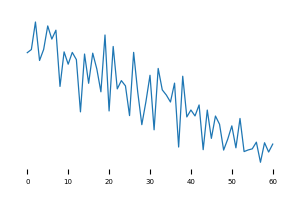
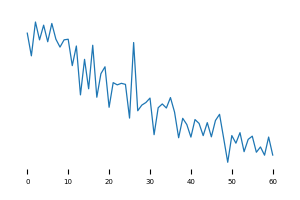
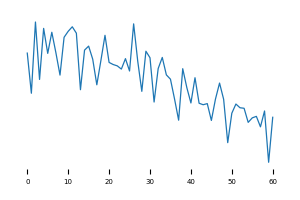

Toothpaste Prescribing


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3496.16rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOUTH EAST LONDON,2019-11-01,0.350305,

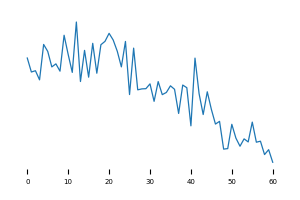

Prescribing of high cost tramadol preparations 


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3987.15rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOUTH SEFTON,2020-05-01,0.144104,
NHS EAST LANCASHIRE,2019-11-01,0.131333,
NHS WIRRAL,2019-05-01,0.125311,
"NHS HAMPSHIRE, SOUTHAMPTON AND ISLE OF WIGHT",2019-02-01,0.056779,
NHS SHEFFIELD,2021-11-01,0.055646,
NHS LIVERPOOL,2021-02-01,-0.002429,

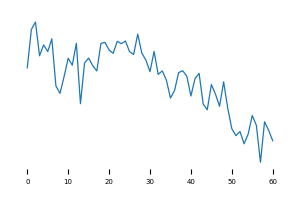
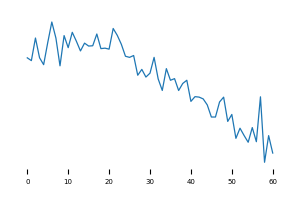
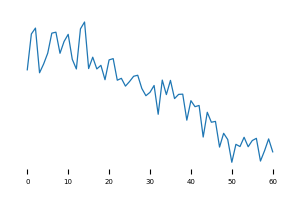
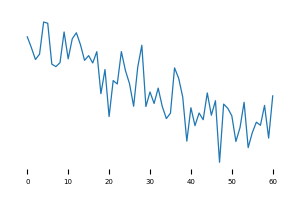
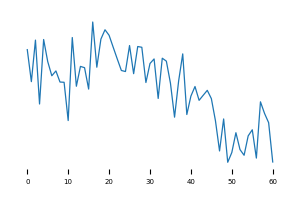
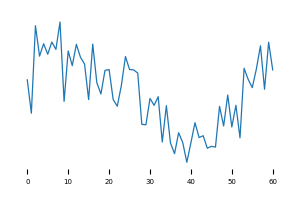

Antibiotic stewardship: prescribing of trimethoprim vs nitrofurantoin


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3996.67rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Ulipristal acetate 5mg prescribing for uterine fibroids


Downloading: 100%|██████████| 457/457 [00:00<00:00, 4703.16rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


Vitamin B vs thiamine


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3772.01rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS EAST AND NORTH HERTFORDSHIRE,2019-11-01,0.657023,
NHS HERTS VALLEYS,2019-10-01,0.647272,
"NHS SHROPSHIRE, TELFORD AND WREKIN",2020-08-01,0.630531,
NHS FRIMLEY,2019-02-01,0.569566,
NHS SOUTHEND,2020-08-01,0.547953,
NHS THURROCK,2020-06-01,0.534409,
NHS LEICESTER CITY,2020-08-01,0.455095,
NHS CASTLE POINT AND ROCHFORD,2020-08-01,0.429110,
NHS WEST ESSEX,2019-11-01,0.424672,

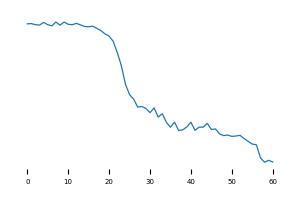
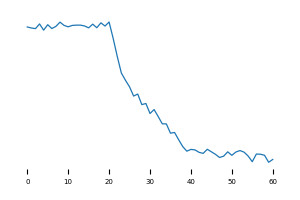
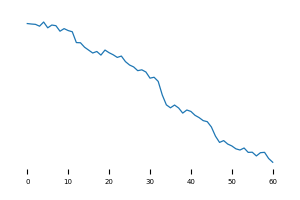
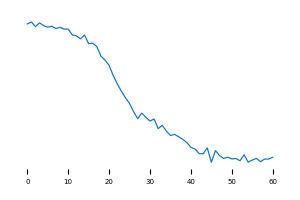
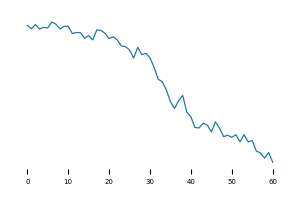
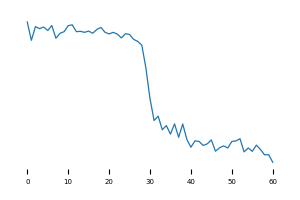
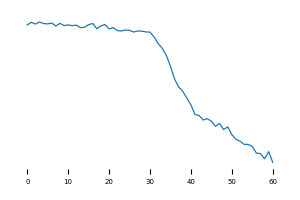
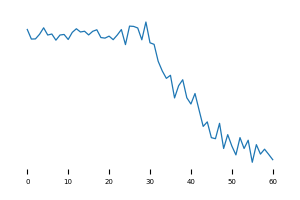
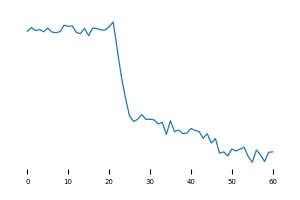
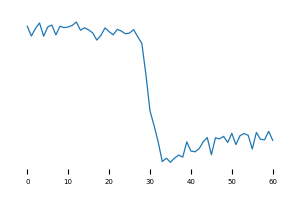

Vitamin B complex per 1000 patients


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3942.96rows/s]


,Month when change detected,Measured proportional change,plots
link,,,
NHS SOUTH SEFTON,2019-08-01,0.970970,
NHS SOUTHPORT AND FORMBY,2019-08-01,0.956865,
NHS ST HELENS,2019-06-01,0.951679,
NHS KNOWSLEY,2019-12-01,0.923373,
NHS KERNOW,2020-02-01,0.859141,
NHS LIVERPOOL,2018-09-01,0.782102,
NHS WEST LANCASHIRE,2018-11-01,0.648277,
NHS LEICESTER CITY,2020-08-01,0.627700,
NHS SHEFFIELD,2019-04-01,0.598862,

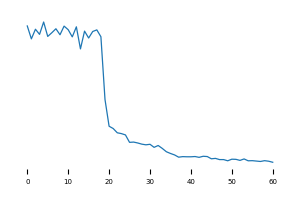
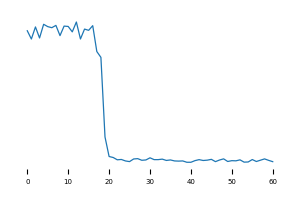
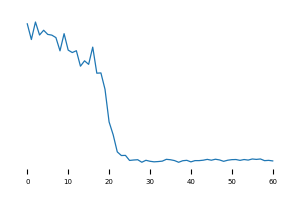
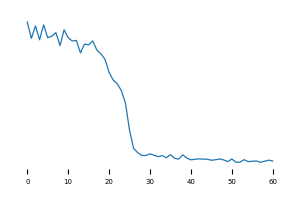
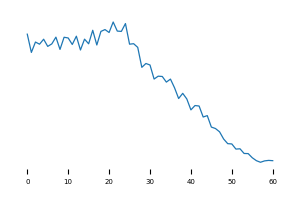
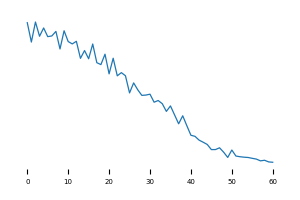
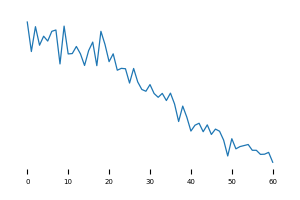
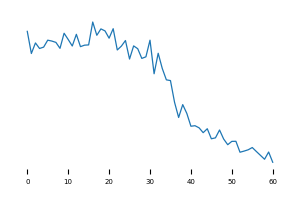
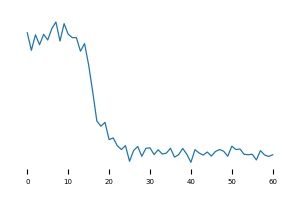
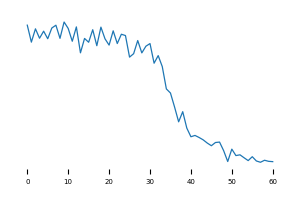

Zuclopenthixol acetate prescribing in primary care


Downloading: 100%|██████████| 457/457 [00:00<00:00, 3801.38rows/s]


,Month when change detected,Measured proportional change,plots
link,,,


In [22]:
tables_df = pd.read_csv('data/ccg_data_/measure_list.csv') #open measure list from import
tables_df = tables_df.merge(name_df, how = 'left', left_on='table_id', right_on='ccg_data_' + name_df['measure_name']) #merge with title names from JSON scraper
tables_df.head()
for index, row in tables_df.iterrows(): # loop through each row to create sparklines
    current_measure = row["table_id"] #define the current measure for loop
    current_name = row["name"] #define the current measure name for loop
    current_dir = 'ccg_data_/'+ current_measure #define the current directory for the loop
    print(current_name) #print measure name
    graph = filtered_sparkline(lp_spark, #create sparkline
                               current_dir,
                               current_measure)
    display(graph) #display graph - neccesary as in a for loop